# Monte carlo integration and model of population growth
###  Dario De Stefano 
Student number: 1838249

## Introduction

In this report, I will study a sequence which is a model fori the evolution of a civilisation. Sequences are extremely useful in science. They can be used to study animal population, but they are also involved in quantum physics and electronics. Python is very easy to learn and it's an interpreted language which results n shorter code and easy to write code and implementation. Python has also many useful libraries for scientifical computation. Even though python is slower in comparison with other languages, for many applications modern computers are powerful enough to compensate for that. Therefore Python is a powerful tool in the hand of every scientist, easy to learn and easy to implement to tackle a broad range of problems.
In the second part, I will use the Monte Carlo algorithm to evaluate integrals. The implementation of the algorithm is extremely easy thanks to numpy smart features (random generations of point and np.where function). The Monte Carlo algorithm can be a useful and quick way to calculate integrals.


### Problem 1: The expanding civilization.
key topics: numpy array, for loops, functions in python, plots with matplotlib, sequences.



1) Write a program by using a “for loop” to compute the convergence point of the sequence for a=1,
and a random number between 0 and 1 for x 0 . We assume in this problem that the sequence
reaches the converge point with n=100 sequence elements, so the convergence point x* can be
approximated by the n=100 element of the sequence (x 100 ).

I will start by definying a function for the sequence:

$x_{n+1} = a x_n(1 - x_n) $

$a$: rate of development of the civilisation. 

$x_0$: initial population level

$x_n$: population level reached 

$1-x_n$: "starvation" term. When the population gets too close to 1 (max sustainable population) this term "kills" the next term in the sequence 


The sequence is defined recursively which is particularly advantageous when it comes to implementation. It is natural to define a function and a for loop to find (and store) the terms of the sequence. 


In [157]:
import numpy as np

def civ(a,x0):
    x=a*x0*(1-x0)
    for n in range(0,100):
        x=a*x*(1-x)
        
    y=np.array([a,x])
    return y
    

In [159]:
import numpy as np 

def civ_print(a1,a2,x0):
    x1=a1*x0*(1-x0)
    x2=a2*x0*(1-x0)
    for n in range(0,100):
        x1=a1*x1*(1-x1)
        x2=a2*x2*(1-x2)
        print("{} \t {}".format(x1,x2))
    
civ_print(2.1,3.5,0.5)


0.5236875 	 0.3828125
0.523821694922 	 0.826934814453
0.523808306387 	 0.500897694845
0.523809645549 	 0.874997179504
0.523809511636 	 0.382819903774
0.523809525027 	 0.82694088767
0.523809523688 	 0.500883795893
0.523809523822 	 0.874997266167
0.523809523808 	 0.382819676286
0.52380952381 	 0.82694070107
0.52380952381 	 0.500884222944
0.52380952381 	 0.874997263524
0.52380952381 	 0.382819683223
0.52380952381 	 0.82694070676
0.52380952381 	 0.500884209922
0.52380952381 	 0.874997263605
0.52380952381 	 0.382819683011
0.52380952381 	 0.826940706586
0.52380952381 	 0.500884210319
0.52380952381 	 0.874997263602
0.52380952381 	 0.382819683018
0.52380952381 	 0.826940706592
0.52380952381 	 0.500884210307
0.52380952381 	 0.874997263602
0.52380952381 	 0.382819683017
0.52380952381 	 0.826940706591
0.52380952381 	 0.500884210307
0.52380952381 	 0.874997263602
0.52380952381 	 0.382819683017
0.52380952381 	 0.826940706591
0.52380952381 	 0.500884210307
0.52380952381 	 0.874997263602
0.5238095238

In the previous cell, I modified the function to print the values of the population, iteration after iteration for different development rates and the same initial condition. This is relevant because it shows something important. When the civilisation develops too fast ($a>3.5$), it dangerously approaches unsustainable population levels ($x=1$) with consequent starvation. These starvation-growth cycles repeat continuously preventing the civilisation from reaching a stable population level.

On the other hand, when $1.5<a<3.5$, after the first period of starvation or growth (depending on whether $x_0$ is big or small) the population level stabilises at a fixed value. This value does NOT depend on the initial condition. This is very important for reasons that I will discuss later.

2) Add a for loop to repeat the same operation for 50 different random initial conditions. All obtained
pairs of data points (a, x*) should be stored in a NumPy array

In [160]:
z=np.zeros(shape=(50,2))

for i in range (0,50):
    ini=np.random.rand(1)
    z[i]=(civ(2.3,ini))
print(z)


[[2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]
 [2.3        0.56521739]


The previous cell clearly shows that after some iterations, the population level stabilizes around the same number, even if 50 random different initial conditions are set.
If a higher value for $a$ is set, the initial condition will determine at which point of the unstable cycles discussed earlier we are after 100 iterations. This is not really relevant because there is no stabilisation anyway in the first place. In other words, if we set the function to do 101 iterations all of the 50 values would change or "swap".
An interesting thing to observe is that there are recurring numbers. It looks like if from 1 fixed point there are more and more "fixed" points recurring in the iterations when a gets higher.

3) Add one more for loop to repeat the same procedure (1-3) for N=2’000 different rate parameters “a”
spanning the interval [1.5,4]. This means that “a” needs to be equal to a=1.5 for the first cycle of
your additional “for loop”, and be equal to “a = 4” for the last cycle of this additional “for loop”.

In [161]:
import numpy as np
w=np.linspace(1.5,4,2000)
h=[]

for l in range (0,2000):
    
    z=np.zeros(shape=(50,2))
    for i in range (0,50):
        ini=np.random.rand(1)
        z[i]=(civ(w[l],ini))   
    h.append(z) 
j=np.asarray(h)

In [162]:
print(j)


[[[1.5        0.33333333]
  [1.5        0.33333333]
  [1.5        0.33333333]
  ...
  [1.5        0.33333333]
  [1.5        0.33333333]
  [1.5        0.33333333]]

 [[1.50125063 0.3338887 ]
  [1.50125063 0.3338887 ]
  [1.50125063 0.3338887 ]
  ...
  [1.50125063 0.3338887 ]
  [1.50125063 0.3338887 ]
  [1.50125063 0.3338887 ]]

 [[1.50250125 0.33444315]
  [1.50250125 0.33444315]
  [1.50250125 0.33444315]
  ...
  [1.50250125 0.33444315]
  [1.50250125 0.33444315]
  [1.50250125 0.33444315]]

 ...

 [[3.99749875 0.62150058]
  [3.99749875 0.89746788]
  [3.99749875 0.44384015]
  ...
  [3.99749875 0.793988  ]
  [3.99749875 0.9805175 ]
  [3.99749875 0.64144348]]

 [[3.99874937 0.02831376]
  [3.99874937 0.17228336]
  [3.99874937 0.16859531]
  ...
  [3.99874937 0.45763542]
  [3.99874937 0.40828472]
  [3.99874937 0.94898301]]

 [[4.         0.68765755]
  [4.         0.81109754]
  [4.         0.04965898]
  ...
  [4.         0.50141482]
  [4.         0.88614964]
  [4.         0.3760815 ]]]


In the previous cell, we repeated the previous procedure 2000 times. After every cycle $a$ gets bigger, the function is called $50$ times and each time it does $100$ iterations.

Since the fixed points do not depend on the initial condition (within the range values of $a$ discussed above) we can think of the array as the evolution (over time) of a civilisation with an increasing rate of development. In other words, we do not need to "start from where we left", we do not need to set $x_0$ to be the previous fixed point: it will still stabilise at the same fixed point. 
More will be discussed in the next section

4) Plot the result (with the matploblib module) obtained for the convergence points x* (or x 100 ) as a
function of the parameter a. Note: if you are out of memory, or Python struggles with the amount of
requested information, decrease N=2’000 to a smaller number, N=100 or N=1000.

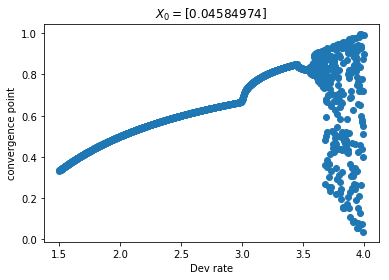

In [163]:
import numpy as np
w=np.linspace(1.5,4,2000)

z=np.zeros(shape=(2000,2))

ini=np.random.rand(1)

for l in range (0,2000):
    z[l]=(civ(w[l],ini))   
    


import matplotlib.pyplot as plt
plt.title("$X_0={}$".format(ini))

plt.xlabel("Dev rate")
plt.ylabel("convergence point")
plt.plot(z[1:2000, 0:1],z[1:2000, 1:2], "o")

w=np.linspace(1.5,4,2000)
L=np.zeros(shape=(2000,2))

plt.show()

As we can see from the graph, when the rate of development reaches a value around 3.5, the population level starts to be completely unstable and oscillating (I will say more on this later). This instability is dangerous because the range of oscillation gets wide enough to reach the critical values $x=0$ and $x=1$. If the collapse of the civilisation is complete or if it reaches the unsustainable level of population and then collapses, obviously it cannot recover anymore. It is interesting to zoom close enough to $a=3.5$ and notice how the oscillation in that area is not completely random, as it seems to be in the right portion of the graph. I will show this in the following plot:

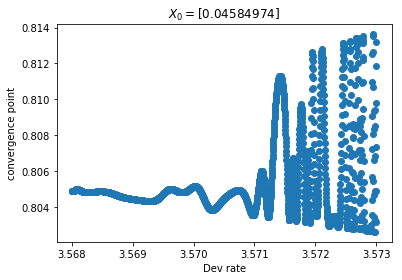

In [164]:
import numpy as np
w=np.linspace(3.568,3.573,2000)

z=np.zeros(shape=(2000,2))

#ini=np.random.rand(1)

for l in range (0,2000):
    z[l]=(civ(w[l],ini))   
    


import matplotlib.pyplot as plt
plt.title("$X_0={}$".format(ini))

plt.xlabel("Dev rate")
plt.ylabel("convergence point")
plt.plot(z[1:2000, 0:1],z[1:2000, 1:2], "o")

w=np.linspace(1.5,4,2000)
L=np.zeros(shape=(2000,2))

plt.show()

It would be interesting to investigate this more by modifying the code to have more iteration (for the first loop) and "pass" every level of population reached in each of the 2000 loops as the initial value for the next cycle.

5) You should have obtained a graphic of the fix points x* of the sequence x n obtained for different
growing rate a. Repeat the same procedure (4-5) with a range of a in [3,4] and then [3.5,3.8].

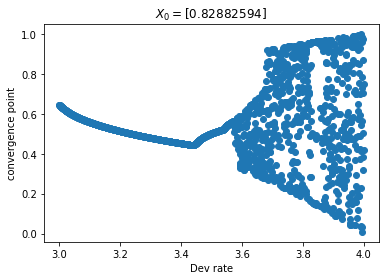

In [165]:
import numpy as np
w=np.linspace(3,4,2000)

z=np.zeros(shape=(2000,2))
ini=np.random.rand(1)

for l in range (0,2000):
    z[l]=(civ(w[l],ini))   
    


import matplotlib.pyplot as plt
plt.title("$X_0={}$".format(ini))

plt.xlabel("Dev rate")
plt.ylabel("convergence point")
plt.plot(z[1:2000, 0:1],z[1:2000, 1:2], "o")


plt.show()

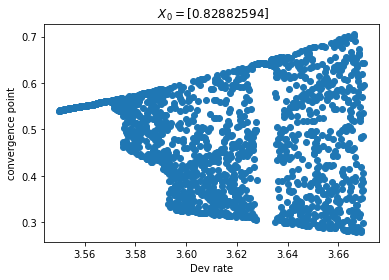

In [166]:
import numpy as np
w=np.linspace(3.55,3.67,2000)

z=np.zeros(shape=(2000,2))


for l in range (0,2000):
    z[l]=(civ(w[l],ini))   
    


import matplotlib.pyplot as plt
plt.title(" $X_0={}$".format(ini))

plt.xlabel("Dev rate")
plt.ylabel("convergence point")
plt.plot(z[1:2000, 0:1],z[1:2000, 1:2], "o")


plt.show()

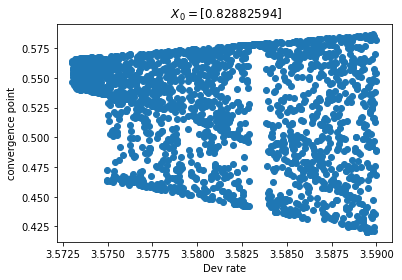

In [167]:
import numpy as np
w=np.linspace(3.573,3.59,2000)
                                        #I added an extra cell and graph
z=np.zeros(shape=(2000,2))


for l in range (0,2000):
    z[l]=(civ(w[l],ini))   
    


import matplotlib.pyplot as plt
plt.title(" $X_0={}$".format(ini))

plt.xlabel("Dev rate")
plt.ylabel("convergence point")
plt.plot(z[1:2000, 0:1],z[1:2000, 1:2], "o")


plt.show()

The plots exhibit self-similarity properties: the same pattern is repeated "within" the previous one if we "zoom".

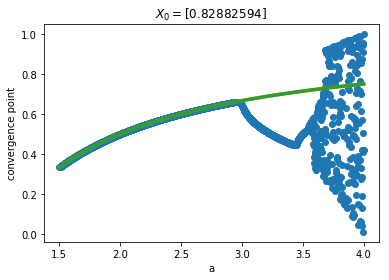

In [168]:
import numpy as np
import matplotlib.pyplot as plt
w=np.linspace(1.5,4,2000)

z=np.zeros(shape=(2000,2))

#ini=np.random.rand(1)

for l in range (0,2000):
    z[l]=(civ(w[l],ini))   
    


import matplotlib.pyplot as plt
plt.title("$X_0={}$".format(ini))

plt.xlabel("Dev rate")
plt.ylabel("convergence point")
plt.plot(z[1:2000, 0:1],z[1:2000, 1:2], "o")

w=np.linspace(1.5,4,2000)
L=np.zeros(shape=(2000,2))



for l in range (0,2000):
    L[l]=(w[l]-1)/w[l] 


plt.xlabel("a")

plt.plot(w,L, "-", linewidth=3.5)


plt.show()

Lastly, in this graph, I am showing how the sequence follows a value (function of a) that we can find analytically (as I will show later) and it diverges from these values when approaching the range when instability occurs. From this graph, I actually noticed that instability starts much earlier (at $a>3.0$) but the range within which the population level oscillates it is not as wide as it gets around $a>3.5$ and it gets narrower after many of the 100 cycles in the first loop. 

The analitical value for the fixed point can be found by taking the limit of each side of the equation that definite the sequence recursively: 

$ \large \lim_{n \to \infty} x_{n+1} = \large a \lim_{n \to \infty}(x_n - x_n^2)                                           $

If we call this limit L and we assume it exists and that it's the same for "n" and "n+1" after many recursions, then we get:

$ \large L= \large a(L-L^2)$

and finally:

$\large L= \frac{\LARGE a-1}{\LARGE a} $

I am not considering the other solution $L=0$


### Problem 2: Monte Carlo Integration
key topics: Monte Carlo algorithm, numpy random generation tool.

1) We first want to compute the integral of $sin(x)^4$ between $x = 0$ and $x = \pi / 2 $. Write a Monte
Carlo code to obtain the integral of $sin(x)^4$ by using N=10,000 random points. Find a strategy
to define the adequate framing “box”. For the example of the area of the circle we were using
a framing square, you need to adapt the same strategy to estimate the area contained under
the function $sin(x)^4$.

In [169]:
import matplotlib.pyplot as plt
import math
import numpy as np
errorList1=[]  #it will be used later
errorList2=[]  #it will be used later
RelErrList2=[] #it will be used later
RelErrList1=[] #it will be used later

def area(angle,n):
    a=np.linspace(0,angle,200)
    
    x = np.random.random(n)*angle
    y = np.random.random(n)


    yin=y[np.where(y<np.sin(x)**4)]
    xin=x[np.where(y<np.sin(x)**4)] 

    ninside = len(yin)

    area=angle*(float(ninside)/n)



    plt.plot(x, y,'b.', label='out')
    plt.plot(xin, yin,'r.', label='in')
    plt.legend(loc=3)


    plt.plot(a,np.sin(a)**4)
    plt.show()
    
    Rarea=(1.0/32)*(12*(angle)- 8*np.sin(2*angle)+np.sin(4*angle))
    err= np.abs(Rarea - area)
    RelErr=np.abs(Rarea - area)*100/Rarea
    errorList2.append(err)
    RelErrList2.append(np.log10(RelErr))
    Rarea=(1.0/32)*(12*(angle)- 8*np.sin(2*angle)+np.sin(4*angle))
                  
    print("real area={}".format(Rarea))
    print("area={}".format(area))
    print("sample size={}".format(n))
    print("Absolute error={}".format(err))
    print("percentage error={}".format(RelErr))

For this exercise, I decided to implement integration by using a function. if we change the only variable that the function takes we can compute the integral over any interval $[0,a]$ with $a\in[0,+\infty]$.

The first step was to generate random points in the interval we need. It was very easy to do.

$\sin(x)^4 \in[0,1] \;\;\;\; \;\;  \forall x \in R $ 

So any $y$ coordinate for our random points can be generated just by using the numpy random generation tool.
For the $x$ coordinate we just need to multiply by the value we want to be the upper limit of the interval. 

The next step is to sort these random points into those under the graph and those above it. I had to think a bit more on how to do this, because there is no "explicit" relation (as for the $\pi$ exercise) having both $x$ and $y$ involved. Obviously, a function f(x) is the relation we need and we can therefore just use the condition $y<\sin(x)^4$ for both xin and yin. 

The area of the rectangle is just the width of the interval over which we want to integrate the function times the "height" of the function itself (1). 

We can, therefore, check how many points (ninside) falls in the area under the graph, in comparison with the total number of points generated (n). This will tell us the portion of the rectangle covered by the area under the graph.
The bigger n is, the more accurate this information will be. Visually, this translates into the whole rectangle covered by dots. 

Lastly, we can just multiply the portion of the rectangle covered by the area under the graph $\frac{ninside}{n}$ by the area of the rectangle itself to find the value of the integral. 

Analitically we find that:

$ \int_0^b \! \sin(x)^4 \, \mathrm{d}x=  \left. \frac{1}{32}  (12x-8\sin(2x)+\sin(4x)) \right|_0^b $

if $b=\frac{\pi}{2}$

$ \int_0^\frac{\pi}{2} \! \sin(x)^4 \, \mathrm{d}x= \frac{1}{32} (12 \frac{\pi}{2}-8 \sin(2 \frac{\pi}{2})+\sin(4\frac{\pi}{2}))=  \frac{1}{32}6\pi=\frac{3\pi}{16}=0.58905... $



if $b=\pi$

$ \int_0^\pi \! \sin(x)^4 \, \mathrm{d}x= \frac{3\pi}{8}=1.1781... $

With  n=10000000, the value generated with python agrees with the predicted value up to the third and fourth significant figures in the two cases.


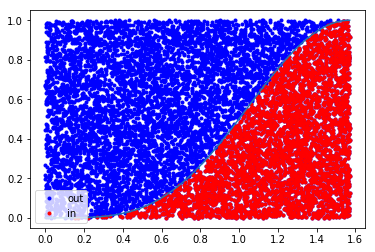

real area=0.589048622548
area=0.591876055936
sample size=10000
Absolute error=0.00282743338823
percentage error=0.48


In [170]:
area(np.pi/2,10000)

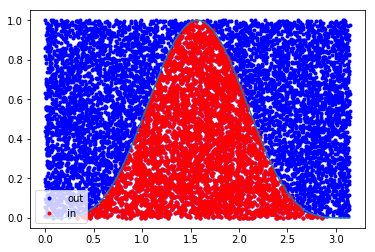

real area=1.1780972451
area=1.18029635995
sample size=10000
Absolute error=0.00219911485751
percentage error=0.186666666667


In [171]:
area(np.pi,10000)

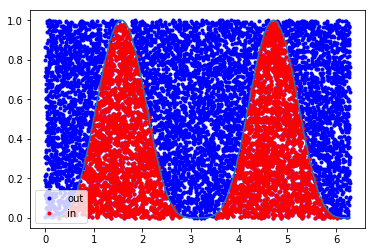

real area=2.35619449019
area=2.36624758668
sample size=10000
Absolute error=0.0100530964915
percentage error=0.426666666667


In [172]:
area(np.pi*2,10000)

2) We now want to obtain the volume contained between a sphere of radius 0.75 and another
larger sphere of radius 1. Modify the Monte Carlo written for the volume of a sphere. Use
N=10,000 sampling points (random points in the cube).

This time I generated 3 arrays of random points, and sorted them using the condition $\sqrt{x^2+y^2+z^2}<r_1$ for the first sphere and $\sqrt{x^2+y^2+z^2}<r_2$ for the second sphere.

The volume of each sphere has been calculated by multiplying the portion of volume occupied by each sphere  $\frac{ninside}{n}$ by the volume of the cube that contains both spheres(8).

Lastly, we just need to find the difference between the two volumes: it's sensible to take the absolute value of this difference, so we don't have to worry about the order of the radii when we pass them to the function.  

In [173]:
def VolDiff(r1,r2,n):  # the function takes two arguments, however it will only work if r1 and r2 are smaller than 1.
    

    x = np.random.random(n)*2-1 # I am considering a sphere centered in the origin.
    y = np.random.random(n)*2-1 # The cube that contains it has l=2, V=8. 
    z = np.random.random(n)*2-1 # I had to generate points in the region where -1< x,y,z <1.
    
    w=np.sqrt(x**2+y**2+z**2) 
    
    yin1=y[np.where(w<r1) [0]]
    xin1=x[np.where(w<r1) [0]] 
    zin1=z[np.where(w<r1) [0]] 
    
    
    ninside1 = len(np.where(w<r1) [0])
    
    yin2=y[np.where(w<r2)[0]]
    xin2=x[np.where(w<r2)[0]] 
    zin2=z[np.where(w<r2)[0]] 
    
    
    ninside2 = len(np.where(w<r2)[0])
  
    vol1=8.0*ninside1/n
    vol2=8.0*ninside2/n
    #print(vol1)
    #print(vol2)
  
    vol=np.abs(vol1-vol2)
   
    
    from mpl_toolkits.mplot3d import Axes3D
    
    ax = plt.axes(projection='3d')
    
    ax.plot(x,y,z,'b.', label='out' )
    ax.plot(xin1, yin1, zin1, 'g.',  label='in1')
    ax.plot(xin2, yin2, zin2, 'y.',  label='in2')
    plt.legend(loc=1)

    plt.show()
    
    Rvol= (4.0/3)*(r1**3 - r2**3 ) *np.pi
    err=np.abs(Rvol-vol)
    RelErr= np.abs(100*(Rvol - vol)/(Rvol))
    errorList1.append(err)
    RelErrList1.append(np.log10(RelErr))
    
    print("real volume difference={}".format(Rvol))
    print("volume difference est={}".format(vol))
    print("sample size={}".format(n))
    print("absolute error={}".format(err))
    print("percentage error={}".format(RelErr))


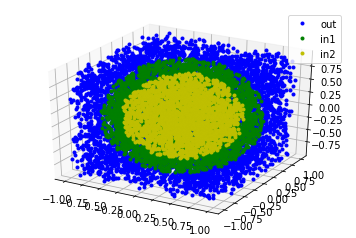

real volume difference=2.42164433714
volume difference est=2.4152
sample size=10000
absolute error=0.00644433714213
percentage error=0.266114104507


In [174]:
VolDiff(1,0.75,10000)

The exact value of the difference is given by:

$ \Delta V=  |V_1 - V_2|  =  |\frac{4}{3} \pi r_1^3 - \frac{4}{3} \pi r_2^3 |= \frac{4}{3} \pi(1-0.75^3)=\frac{4}{3} \pi(0.578125)=2.4216...$


For large n, the distribution of $\bar{y}-\mu_y$ will approach a normal distribution with variance $\frac{\sigma_y^2}{n}$. Every time we perform Monte Carlo integration we obtain a different value $\bar{y}$ which is the value we get for the volumes. $\mu_y$ is the value we can find using the formula for the volume of the sphere.

We know that 99% of results computed by python will be in this range: 

$-3\frac{\sigma_y}{\sqrt{n}}<\bar{y}-\mu_y<3\frac{\sigma_y}{\sqrt{n}}$

If we want more precise results, namely if we want to make $\bar{y}-\mu_y$ smaller we need to increase $\sqrt{n}$. Every time n increases by 100, the error will reduce by a factor of 10.

"...Thus, the standard error decreases with the square root of the sample size". In other words, to decrease the variability in the mean estimate by a factor of 10 requires a factor of 100 increase in the number of Monte Carlo trials..."

(source: https://ocw.mit.edu/courses/aeronautics-and-astronautics/16-90-computational-methods-in-aerospace-engineering-spring-2014/probabilistic-methods-and-optimization/error-estimates-for-the-monte-carlo-method/)

I would also like to quote this:

"which decreases as $ {\tfrac {1}{{\sqrt {N}}}}$. This is the standard error of the mean [...]. This result does NOT depend on the number of dimensions of the integral, which is the promised advantage of Monte Carlo integration against most deterministic methods that depend exponentially on the dimension."

(source: https://en.wikipedia.org/wiki/Monte_Carlo_integration)

In the next cell, I will perform some computations to show that what we said so far is consistent with the numbers we get. 

(!!!) I modified the previous two functions to print area (or volume), n (now it's an argument) and the error. I am not updating all the previous comments to take into account these small changes.

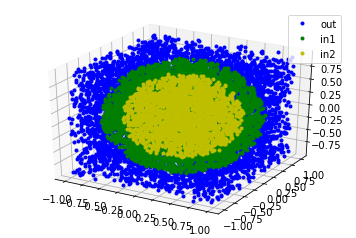

real volume difference=2.42164433714
volume difference est=2.4608
sample size=10000
absolute error=0.0391556628579
percentage error=1.61690394652


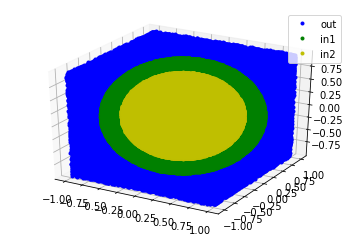

real volume difference=2.42164433714
volume difference est=2.424232
sample size=1000000
absolute error=0.00258766285787
percentage error=0.106855611213


In [175]:
VolDiff(1,0.75,10000)
VolDiff(1,0.75,1000000)

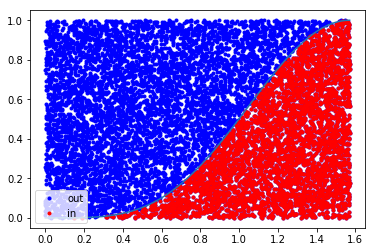

real area=0.589048622548
area=0.594232250427
sample size=10000
Absolute error=0.00518362787842
percentage error=0.88


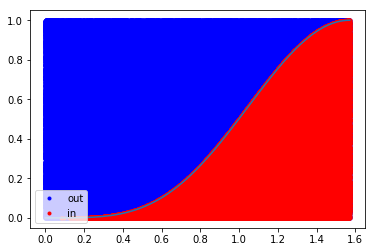

real area=0.589048622548
area=0.589859153453
sample size=1000000
Absolute error=0.000810530904626
percentage error=0.1376


In [176]:
area(np.pi/2,10000)
area(np.pi/2,1000000)

As expected as we increase n by a factor of 100, the error decreases by a factor of 10. The error does not have  the same order of magnitude in both cases. I think the reason is that the standard deviation for the two distributions is different. Also, the error will not be randomly bigger or smaller because the value will more or less close to the mean value of the normal distribution which is equal to the exact value.
In the followinng cell I will iterate the calculation of the error several times. In both cases the dots seem to follow a distribution similar to:

$E(n)= \sigma\frac{1}{\sqrt(n)}$

The next cell will take a long time to execute. I reccomend to chan

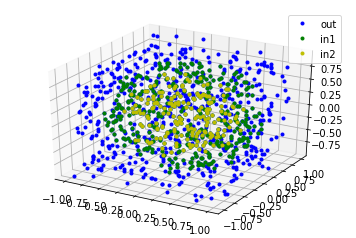

real volume difference=2.42164433714
volume difference est=2.472
sample size=1000
absolute error=0.0503556628579
percentage error=2.07939960817


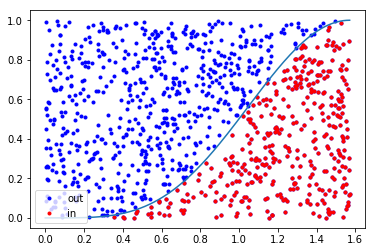

real area=0.589048622548
area=0.587477826221
sample size=1000
Absolute error=0.00157079632679
percentage error=0.266666666667


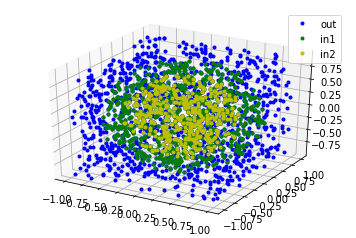

real volume difference=2.42164433714
volume difference est=2.44
sample size=2000
absolute error=0.0183556628579
percentage error=0.757983432015


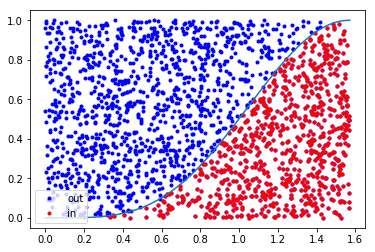

real area=0.589048622548
area=0.618108354594
sample size=2000
Absolute error=0.0290597320457
percentage error=4.93333333333


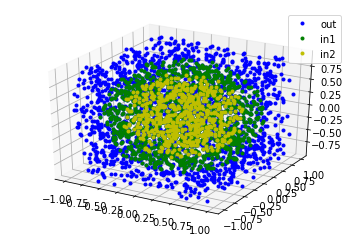

real volume difference=2.42164433714
volume difference est=2.58933333333
sample size=3000
absolute error=0.167688996191
percentage error=6.92459225408


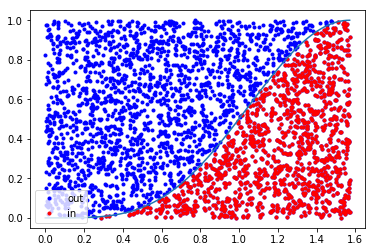

real area=0.589048622548
area=0.593761011528
sample size=3000
Absolute error=0.00471238898038
percentage error=0.8


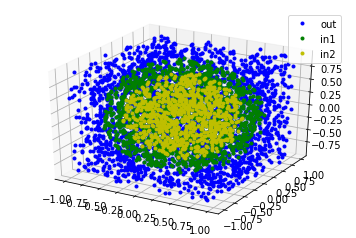

real volume difference=2.42164433714
volume difference est=2.384
sample size=4000
absolute error=0.0376443371421
percentage error=1.55449487626


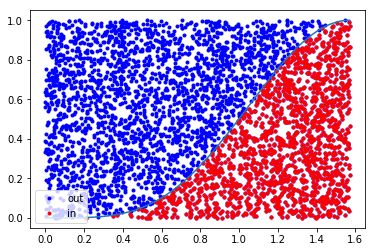

real area=0.589048622548
area=0.597295303264
sample size=4000
Absolute error=0.00824668071567
percentage error=1.4


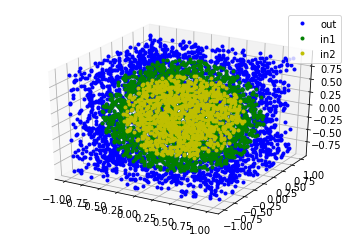

real volume difference=2.42164433714
volume difference est=2.3472
sample size=5000
absolute error=0.0744443371421
percentage error=3.07412347884


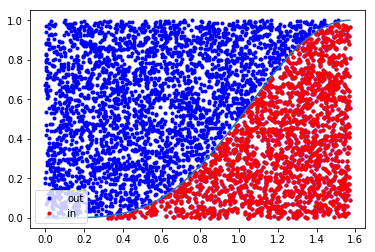

real area=0.589048622548
area=0.58622118916
sample size=5000
Absolute error=0.00282743338823
percentage error=0.48


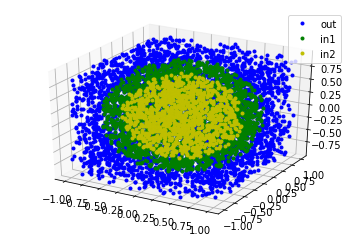

real volume difference=2.42164433714
volume difference est=2.43866666667
sample size=6000
absolute error=0.0170223295245
percentage error=0.702924424675


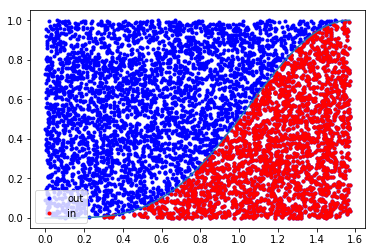

real area=0.589048622548
area=0.596117206019
sample size=6000
Absolute error=0.00706858347058
percentage error=1.2


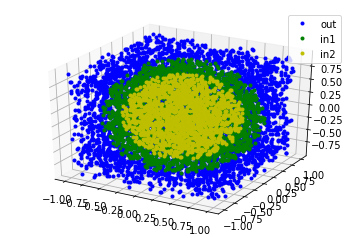

real volume difference=2.42164433714
volume difference est=2.37942857143
sample size=7000
absolute error=0.0422157657136
percentage error=1.74326861571


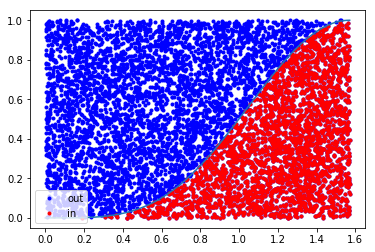

real area=0.589048622548
area=0.592414614677
sample size=7000
Absolute error=0.00336599212885
percentage error=0.571428571429


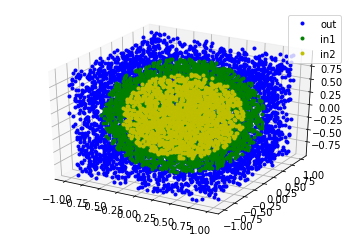

real volume difference=2.42164433714
volume difference est=2.467
sample size=8000
absolute error=0.0453556628579
percentage error=1.87292833065


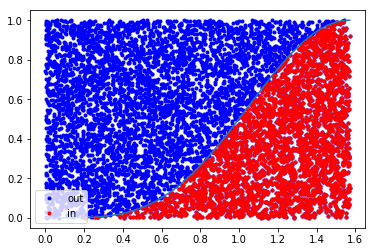

real area=0.589048622548
area=0.59415371061
sample size=8000
Absolute error=0.00510508806208
percentage error=0.866666666667


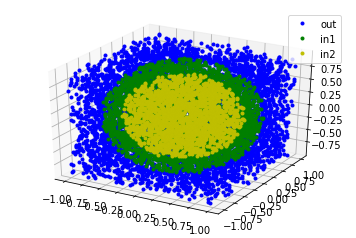

real volume difference=2.42164433714
volume difference est=2.38133333333
sample size=9000
absolute error=0.0403110038088
percentage error=1.66461289094


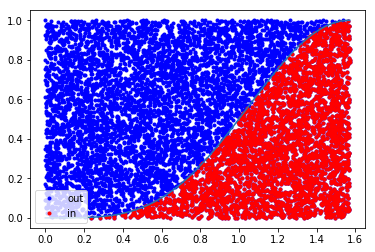

real area=0.589048622548
area=0.593062879828
sample size=9000
Absolute error=0.00401425727959
percentage error=0.681481481481


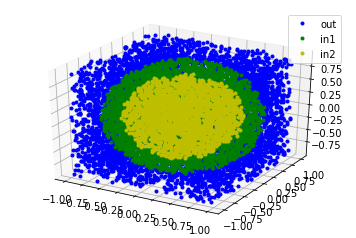

real volume difference=2.42164433714
volume difference est=2.3432
sample size=10000
absolute error=0.0784443371421
percentage error=3.23930050086


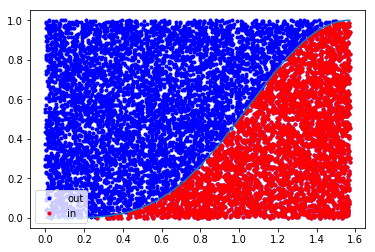

real area=0.589048622548
area=0.594389330059
sample size=10000
Absolute error=0.0053407075111
percentage error=0.906666666667


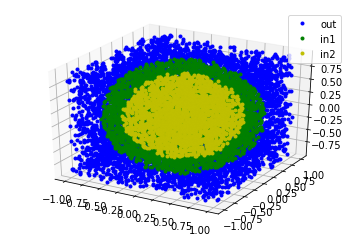

real volume difference=2.42164433714
volume difference est=2.47127272727
sample size=11000
absolute error=0.0496283901306
percentage error=2.04936742235


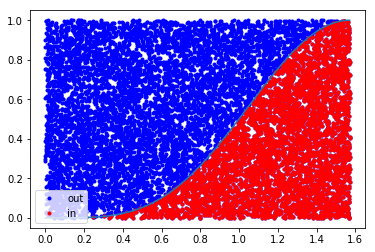

real area=0.589048622548
area=0.589477021546
sample size=11000
Absolute error=0.000428398998217
percentage error=0.0727272727273


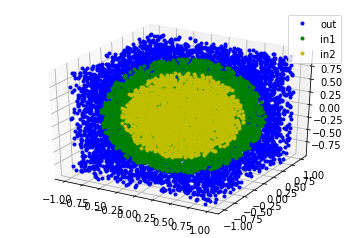

real volume difference=2.42164433714
volume difference est=2.47
sample size=12000
absolute error=0.0483556628579
percentage error=1.99681109716


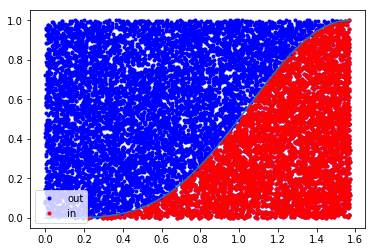

real area=0.589048622548
area=0.593106513059
sample size=12000
Absolute error=0.00405789051089
percentage error=0.688888888889


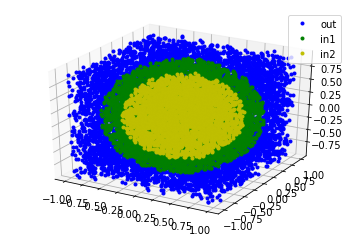

real volume difference=2.42164433714
volume difference est=2.46523076923
sample size=13000
absolute error=0.0435864320886
percentage error=1.79986926322


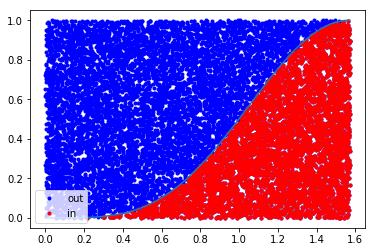

real area=0.589048622548
area=0.595573468829
sample size=13000
Absolute error=0.00652484628053
percentage error=1.10769230769


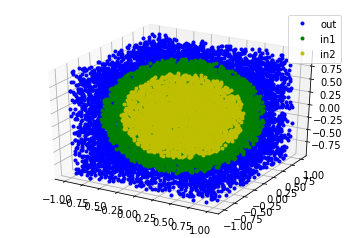

real volume difference=2.42164433714
volume difference est=2.448
sample size=14000
absolute error=0.0263556628579
percentage error=1.08833747605


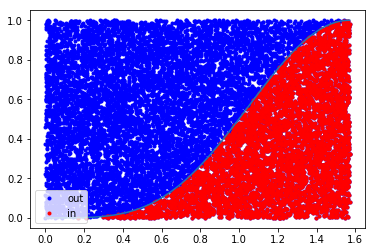

real area=0.589048622548
area=0.576257852458
sample size=14000
Absolute error=0.0127907700896
percentage error=2.17142857143


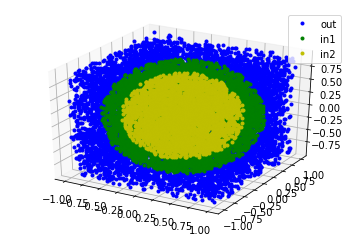

real volume difference=2.42164433714
volume difference est=2.44053333333
sample size=15000
absolute error=0.0188889961912
percentage error=0.780007034951


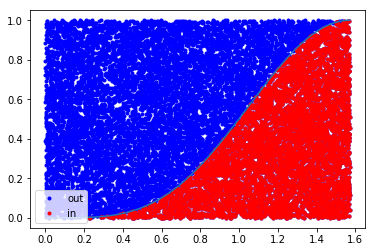

real area=0.589048622548
area=0.589886380589
sample size=15000
Absolute error=0.000837758040957
percentage error=0.142222222222


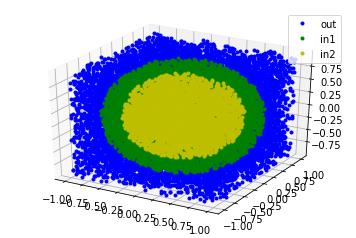

real volume difference=2.42164433714
volume difference est=2.4435
sample size=16000
absolute error=0.0218556628579
percentage error=0.902513326282


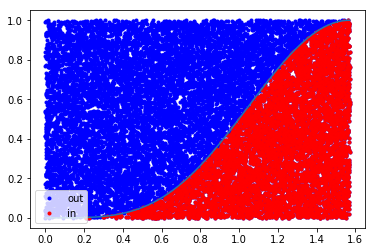

real area=0.589048622548
area=0.588655923466
sample size=16000
Absolute error=0.000392699081699
percentage error=0.0666666666667


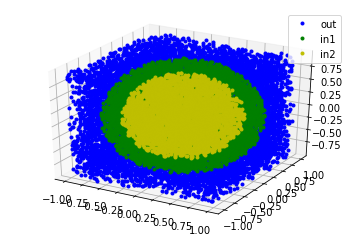

real volume difference=2.42164433714
volume difference est=2.41929411765
sample size=17000
absolute error=0.00235021949507
percentage error=0.0970505643222


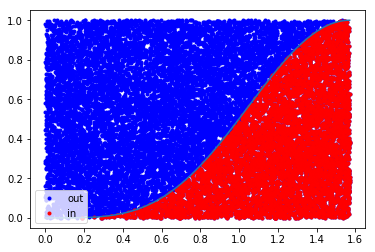

real area=0.589048622548
area=0.583504635512
sample size=17000
Absolute error=0.00554398703575
percentage error=0.941176470588


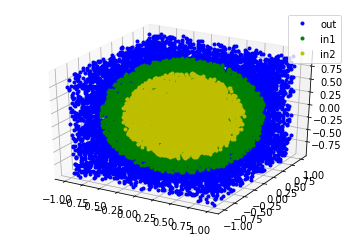

real volume difference=2.42164433714
volume difference est=2.39155555556
sample size=18000
absolute error=0.0300887815866
percentage error=1.24249383467


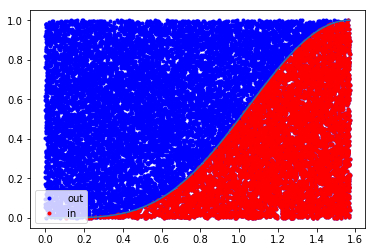

real area=0.589048622548
area=0.592277481664
sample size=18000
Absolute error=0.00322885911619
percentage error=0.548148148148


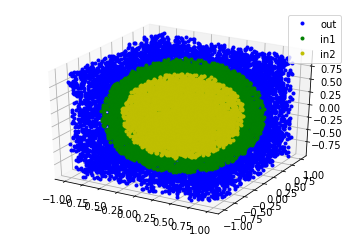

real volume difference=2.42164433714
volume difference est=2.40168421053
sample size=19000
absolute error=0.0199601266158
percentage error=0.824238568384


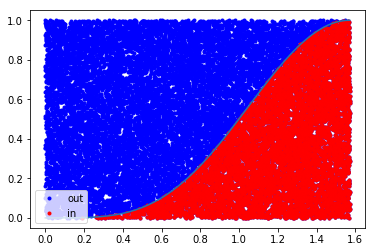

real area=0.589048622548
area=0.591446153784
sample size=19000
Absolute error=0.00239753123563
percentage error=0.40701754386


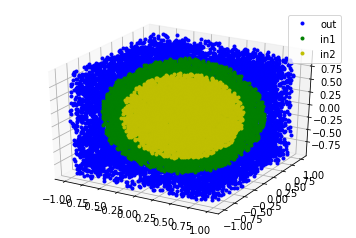

real volume difference=2.42164433714
volume difference est=2.4236
sample size=20000
absolute error=0.00195566285787
percentage error=0.0807576417343


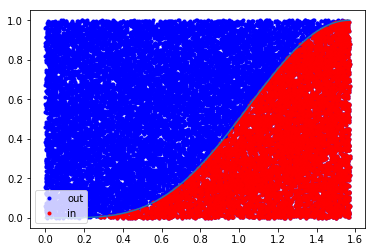

real area=0.589048622548
area=0.582058578894
sample size=20000
Absolute error=0.00699004365424
percentage error=1.18666666667


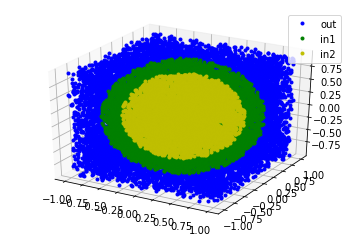

real volume difference=2.42164433714
volume difference est=2.38704761905
sample size=21000
absolute error=0.0345967180945
percentage error=1.42864571663


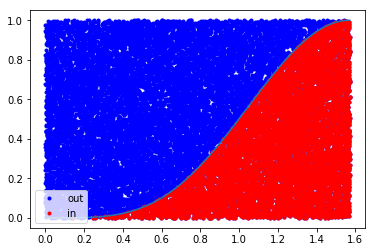

real area=0.589048622548
area=0.601689792988
sample size=21000
Absolute error=0.0126411704394
percentage error=2.14603174603


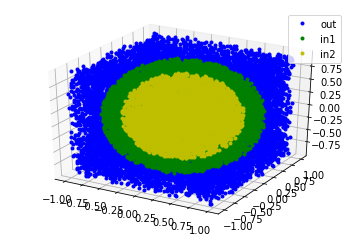

real volume difference=2.42164433714
volume difference est=2.43090909091
sample size=22000
absolute error=0.00926475376696
percentage error=0.382581109243


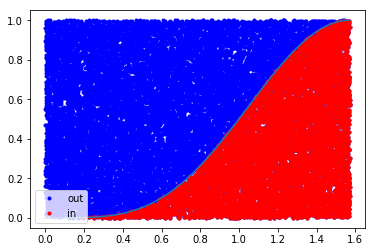

real area=0.589048622548
area=0.585264431397
sample size=22000
Absolute error=0.00378419115091
percentage error=0.642424242424


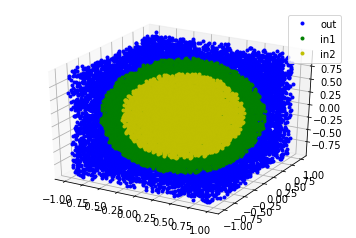

real volume difference=2.42164433714
volume difference est=2.43826086957
sample size=23000
absolute error=0.0166165324231
percentage error=0.686167335485


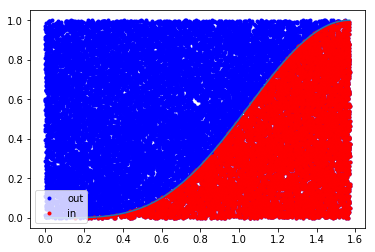

real area=0.589048622548
area=0.588502258608
sample size=23000
Absolute error=0.000546363939755
percentage error=0.0927536231884


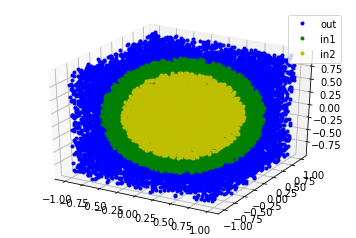

real volume difference=2.42164433714
volume difference est=2.41433333333
sample size=24000
absolute error=0.0073110038088
percentage error=0.301902459278


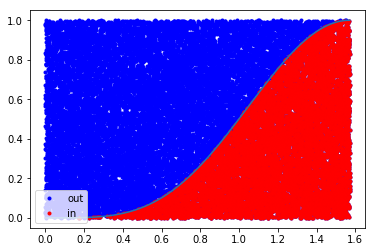

real area=0.589048622548
area=0.594939108774
sample size=24000
Absolute error=0.00589048622548
percentage error=1.0


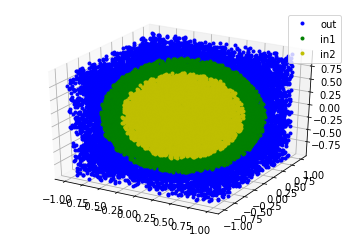

real volume difference=2.42164433714
volume difference est=2.42304
sample size=25000
absolute error=0.00139566285787
percentage error=0.0576328586515


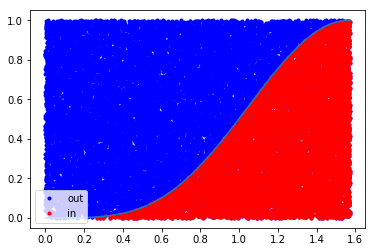

real area=0.589048622548
area=0.591499064818
sample size=25000
Absolute error=0.0024504422698
percentage error=0.416


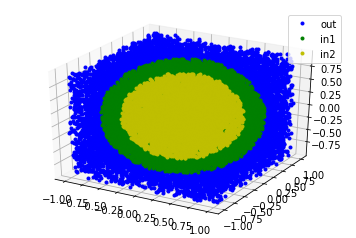

real volume difference=2.42164433714
volume difference est=2.40184615385
sample size=26000
absolute error=0.019798183296
percentage error=0.817551239557


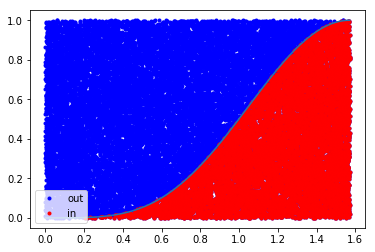

real area=0.589048622548
area=0.592250630445
sample size=26000
Absolute error=0.00320200789693
percentage error=0.54358974359


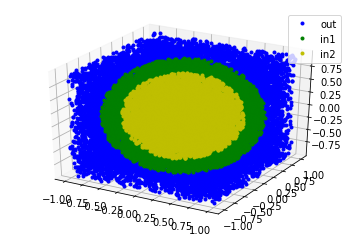

real volume difference=2.42164433714
volume difference est=2.42103703704
sample size=27000
absolute error=0.000607300105095
percentage error=0.025078005708


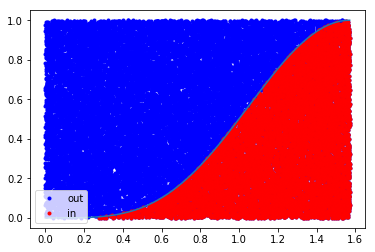

real area=0.589048622548
area=0.587477826221
sample size=27000
Absolute error=0.00157079632679
percentage error=0.266666666667


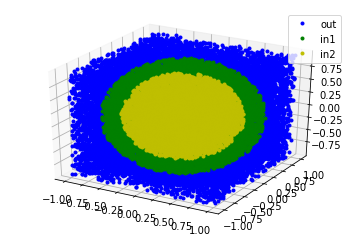

real volume difference=2.42164433714
volume difference est=2.38657142857
sample size=28000
absolute error=0.0350729085707
percentage error=1.44830964782


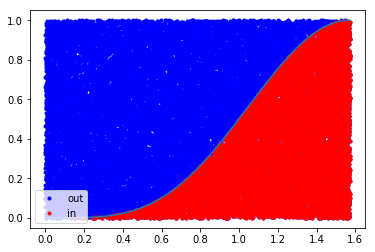

real area=0.589048622548
area=0.590956018088
sample size=28000
Absolute error=0.00190739553968
percentage error=0.32380952381


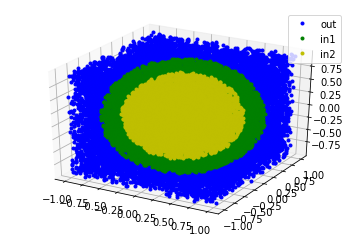

real volume difference=2.42164433714
volume difference est=2.41765517241
sample size=29000
absolute error=0.00398916472834
percentage error=0.164729587543


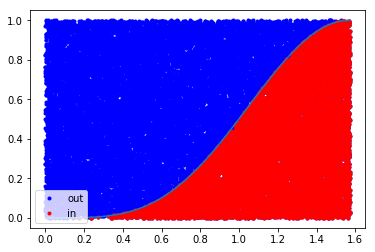

real area=0.589048622548
area=0.594790153949
sample size=29000
Absolute error=0.00574153140139
percentage error=0.974712643678


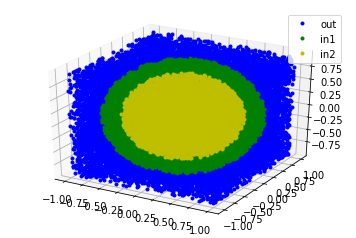

real volume difference=2.42164433714
volume difference est=2.4216
sample size=30000
absolute error=4.43371421324e-05
percentage error=0.00183086927557


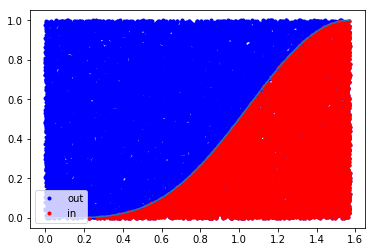

real area=0.589048622548
area=0.588734463283
sample size=30000
Absolute error=0.000314159265359
percentage error=0.0533333333333


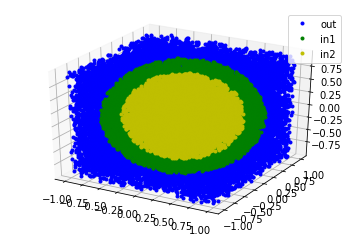

real volume difference=2.42164433714
volume difference est=2.39922580645
sample size=31000
absolute error=0.0224185306905
percentage error=0.925756534379


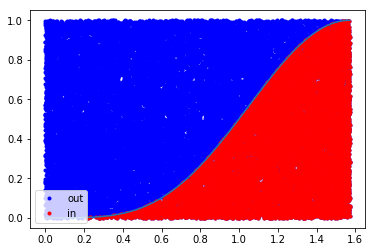

real area=0.589048622548
area=0.5922915569
sample size=31000
Absolute error=0.00324293435209
percentage error=0.550537634409


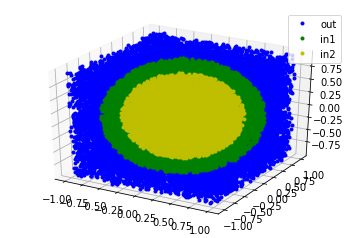

real volume difference=2.42164433714
volume difference est=2.4215
sample size=32000
absolute error=0.000144337142132
percentage error=0.00596029482605


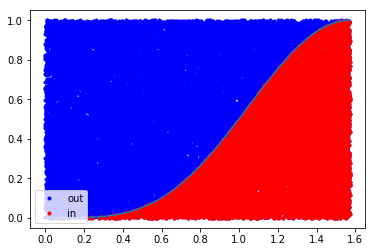

real area=0.589048622548
area=0.588999535163
sample size=32000
Absolute error=4.90873852124e-05
percentage error=0.00833333333334


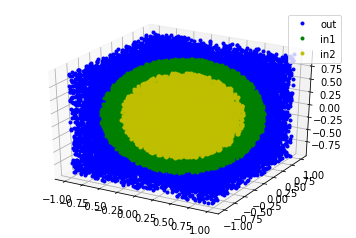

real volume difference=2.42164433714
volume difference est=2.44436363636
sample size=33000
absolute error=0.0227192992215
percentage error=0.938176546946


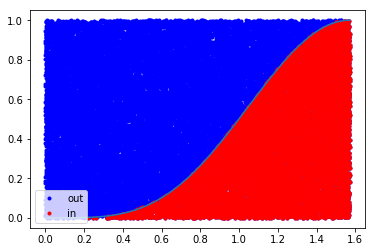

real area=0.589048622548
area=0.585431031008
sample size=33000
Absolute error=0.0036175915405
percentage error=0.614141414141


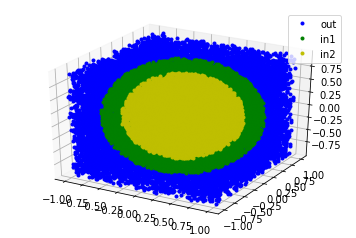

real volume difference=2.42164433714
volume difference est=2.40658823529
sample size=34000
absolute error=0.015056101848
percentage error=0.62173051662


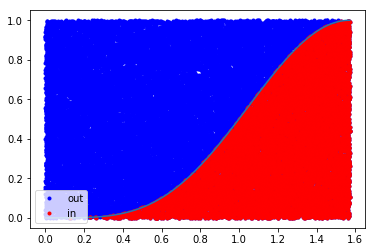

real area=0.589048622548
area=0.589880220603
sample size=34000
Absolute error=0.000831598055362
percentage error=0.141176470588


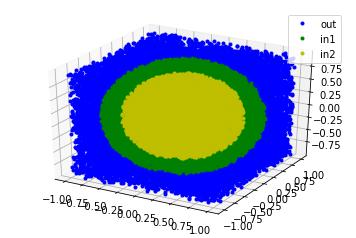

real volume difference=2.42164433714
volume difference est=2.40914285714
sample size=35000
absolute error=0.0125014799993
percentage error=0.51623930928


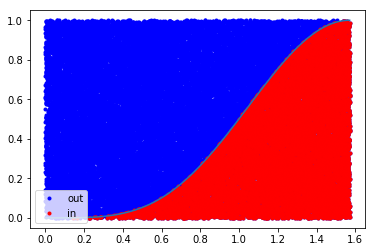

real area=0.589048622548
area=0.588958862758
sample size=35000
Absolute error=8.97597901026e-05
percentage error=0.0152380952381


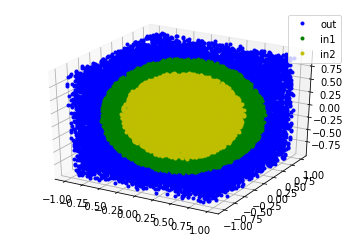

real volume difference=2.42164433714
volume difference est=2.41911111111
sample size=36000
absolute error=0.00253322603102
percentage error=0.104607682977


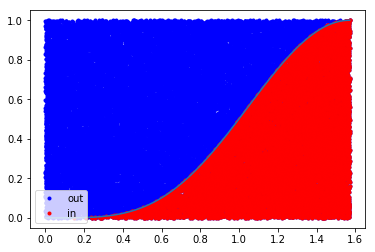

real area=0.589048622548
area=0.583943534486
sample size=36000
Absolute error=0.00510508806208
percentage error=0.866666666667


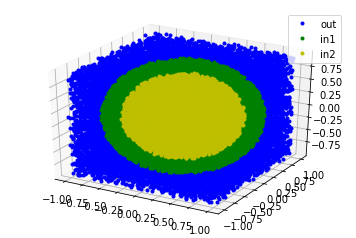

real volume difference=2.42164433714
volume difference est=2.41902702703
sample size=37000
absolute error=0.00261731011511
percentage error=0.108079872629


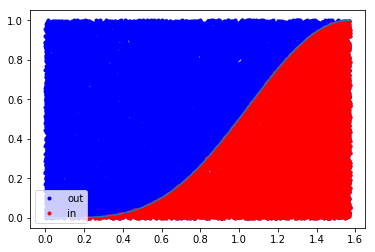

real area=0.589048622548
area=0.588454267181
sample size=37000
Absolute error=0.000594355366895
percentage error=0.100900900901


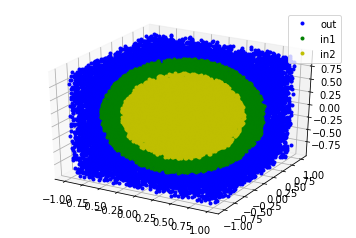

real volume difference=2.42164433714
volume difference est=2.39368421053
sample size=38000
absolute error=0.0279601266158
percentage error=1.15459261242


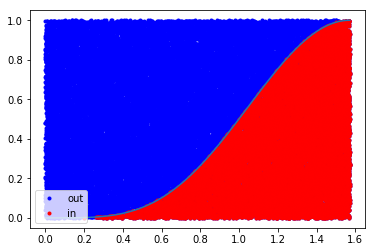

real area=0.589048622548
area=0.586733764803
sample size=38000
Absolute error=0.00231485774475
percentage error=0.39298245614


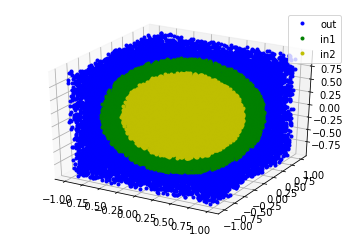

real volume difference=2.42164433714
volume difference est=2.45169230769
sample size=39000
absolute error=0.0300479705502
percentage error=1.2408085733


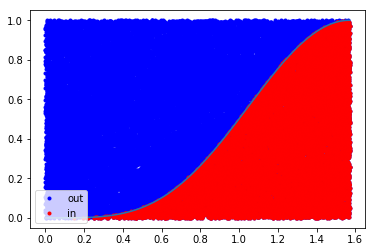

real area=0.589048622548
area=0.585463984777
sample size=39000
Absolute error=0.0035846377714
percentage error=0.608547008547


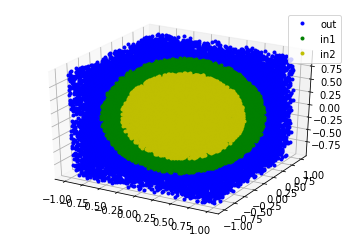

real volume difference=2.42164433714
volume difference est=2.4128
sample size=40000
absolute error=0.00884433714213
percentage error=0.365220317719


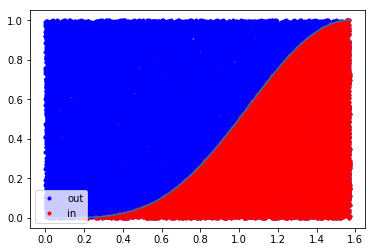

real area=0.589048622548
area=0.59328977263
sample size=40000
Absolute error=0.00424115008235
percentage error=0.72


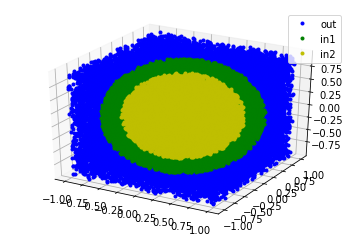

real volume difference=2.42164433714
volume difference est=2.40624390244
sample size=41000
absolute error=0.0154004347031
percentage error=0.635949485517


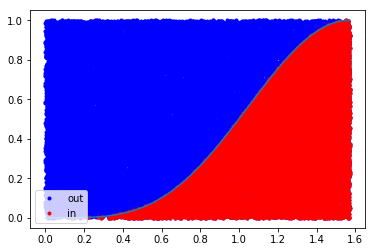

real area=0.589048622548
area=0.589316807287
sample size=41000
Absolute error=0.000268184738721
percentage error=0.0455284552845


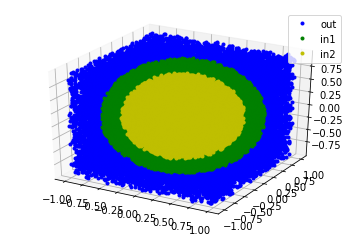

real volume difference=2.42164433714
volume difference est=2.4
sample size=42000
absolute error=0.0216443371421
percentage error=0.893786788182


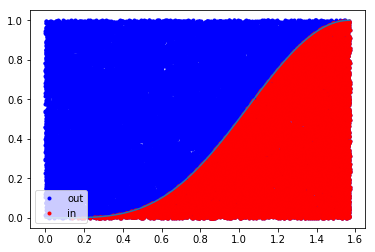

real area=0.589048622548
area=0.592227615114
sample size=42000
Absolute error=0.00317899256613
percentage error=0.539682539683


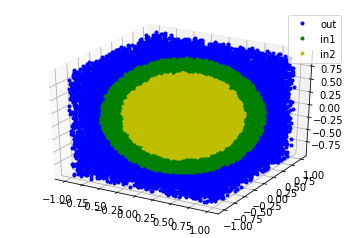

real volume difference=2.42164433714
volume difference est=2.4176744186
sample size=43000
absolute error=0.00396991853748
percentage error=0.16393483042


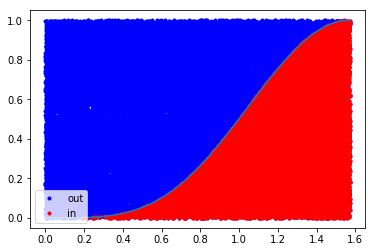

real area=0.589048622548
area=0.587331705633
sample size=43000
Absolute error=0.00171691691533
percentage error=0.291472868217


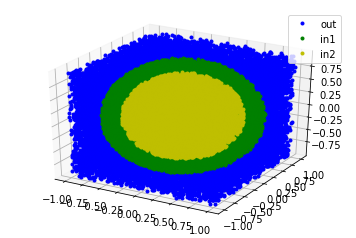

real volume difference=2.42164433714
volume difference est=2.46909090909
sample size=44000
absolute error=0.0474465719488
percentage error=1.95927086489


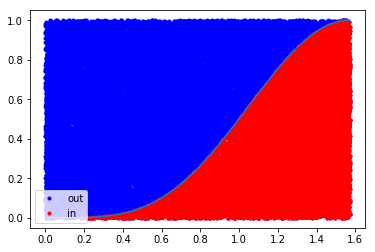

real area=0.589048622548
area=0.590940718124
sample size=44000
Absolute error=0.00189209557546
percentage error=0.321212121212


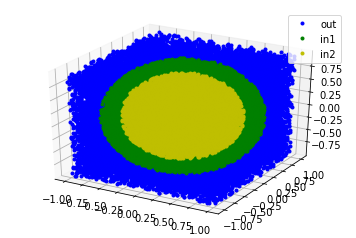

real volume difference=2.42164433714
volume difference est=2.45013333333
sample size=45000
absolute error=0.0284889961912
percentage error=1.1764318878


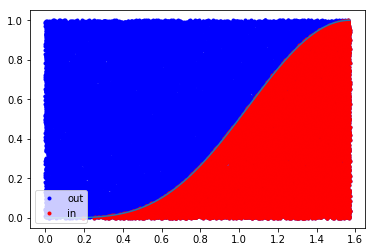

real area=0.589048622548
area=0.590340166195
sample size=45000
Absolute error=0.00129154364648
percentage error=0.219259259259


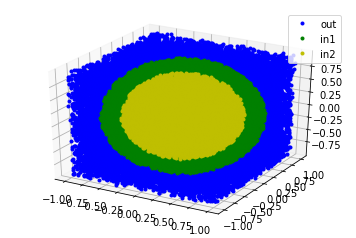

real volume difference=2.42164433714
volume difference est=2.44643478261
sample size=46000
absolute error=0.0247904454666
percentage error=1.02370298918


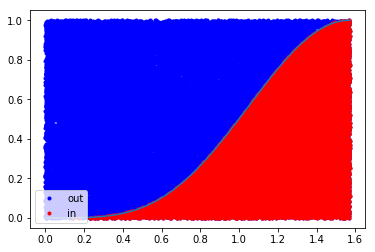

real area=0.589048622548
area=0.587204644251
sample size=46000
Absolute error=0.00184397829667
percentage error=0.313043478261


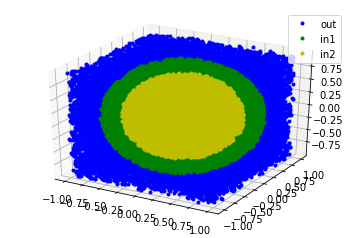

real volume difference=2.42164433714
volume difference est=2.43710638298
sample size=47000
absolute error=0.0154620458366
percentage error=0.638493671405


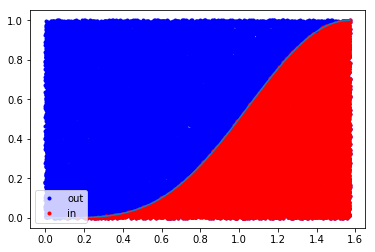

real area=0.589048622548
area=0.590619418875
sample size=47000
Absolute error=0.00157079632679
percentage error=0.266666666667


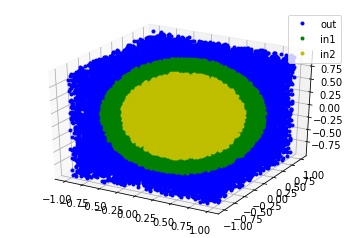

real volume difference=2.42164433714
volume difference est=2.45833333333
sample size=48000
absolute error=0.0366889961912
percentage error=1.51504478294


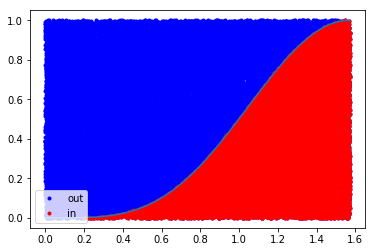

real area=0.589048622548
area=0.590619418875
sample size=48000
Absolute error=0.00157079632679
percentage error=0.266666666667


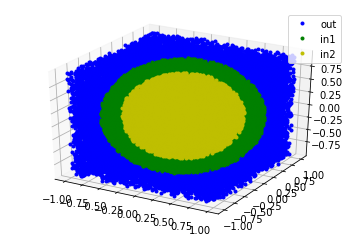

real volume difference=2.42164433714
volume difference est=2.43444897959
sample size=49000
absolute error=0.0128046424497
percentage error=0.528758176967


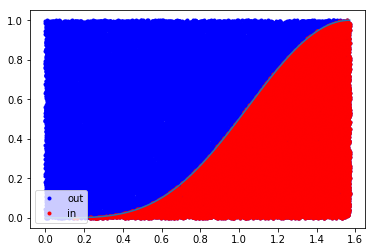

real area=0.589048622548
area=0.591997872794
sample size=49000
Absolute error=0.00294925024623
percentage error=0.500680272109


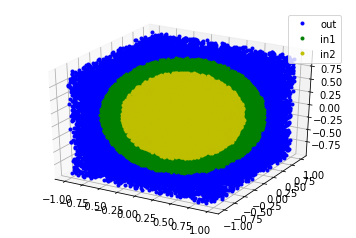

real volume difference=2.42164433714
volume difference est=2.43664
sample size=50000
absolute error=0.0149956628579
percentage error=0.619234733518


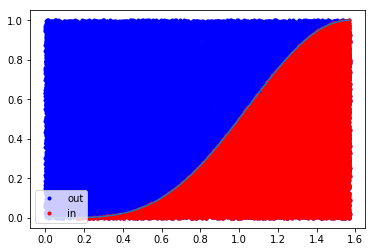

real area=0.589048622548
area=0.580252163118
sample size=50000
Absolute error=0.00879645943005
percentage error=1.49333333333


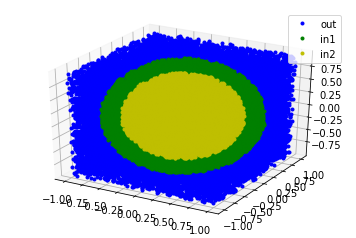

real volume difference=2.42164433714
volume difference est=2.41584313725
sample size=51000
absolute error=0.00580119988723
percentage error=0.239556230378


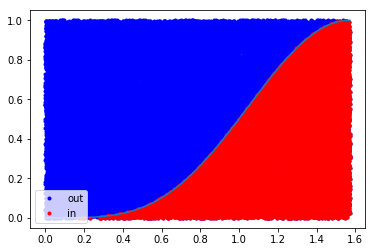

real area=0.589048622548
area=0.583720235008
sample size=51000
Absolute error=0.00532838753991
percentage error=0.904575163399


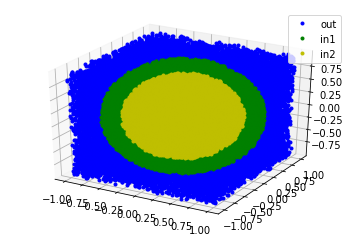

real volume difference=2.42164433714
volume difference est=2.41938461538
sample size=52000
absolute error=0.00225972175752
percentage error=0.0933135276249


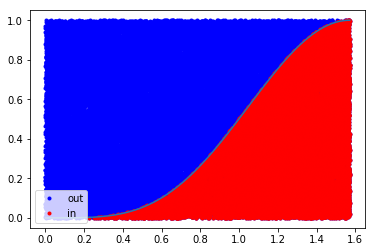

real area=0.589048622548
area=0.59252249904
sample size=52000
Absolute error=0.00347387649195
percentage error=0.589743589744


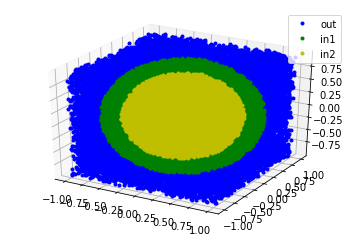

real volume difference=2.42164433714
volume difference est=2.4
sample size=53000
absolute error=0.0216443371421
percentage error=0.893786788182


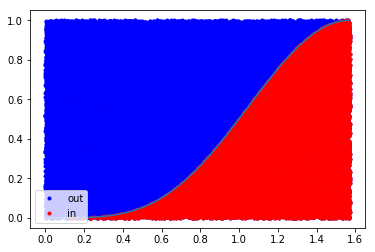

real area=0.589048622548
area=0.595065068856
sample size=53000
Absolute error=0.00601644630829
percentage error=1.0213836478


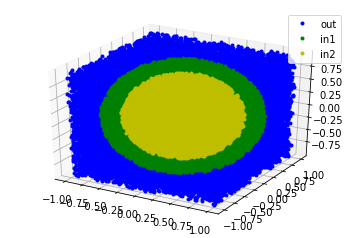

real volume difference=2.42164433714
volume difference est=2.3917037037
sample size=54000
absolute error=0.0299406334384
percentage error=1.23637616719


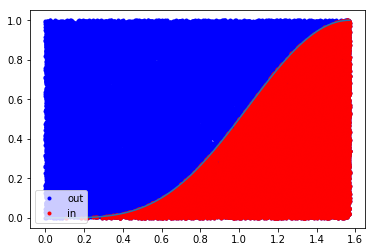

real area=0.589048622548
area=0.590357619487
sample size=54000
Absolute error=0.001308996939
percentage error=0.222222222222


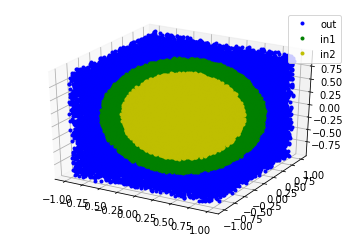

real volume difference=2.42164433714
volume difference est=2.41192727273
sample size=55000
absolute error=0.00971706441486
percentage error=0.401258940705


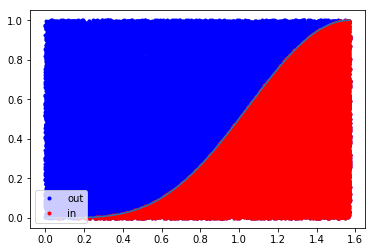

real area=0.589048622548
area=0.590476619209
sample size=55000
Absolute error=0.00142799666072
percentage error=0.242424242424


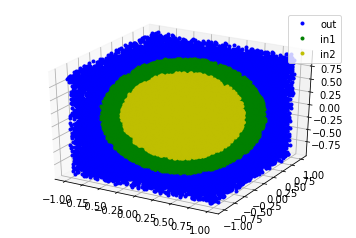

real volume difference=2.42164433714
volume difference est=2.43685714286
sample size=56000
absolute error=0.015212805715
percentage error=0.628201486142


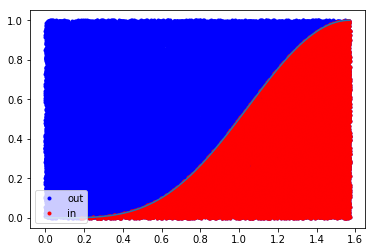

real area=0.589048622548
area=0.584644782846
sample size=56000
Absolute error=0.00440383970191
percentage error=0.747619047619


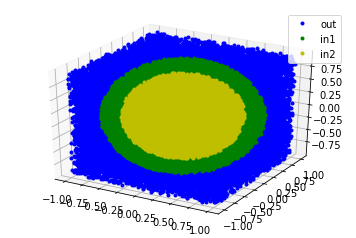

real volume difference=2.42164433714
volume difference est=2.42792982456
sample size=57000
absolute error=0.00628548741927
percentage error=0.259554523464


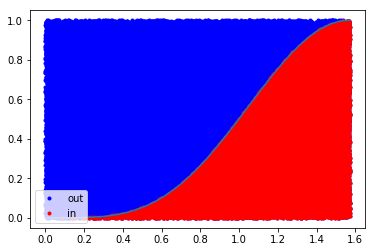

real area=0.589048622548
area=0.59486332474
sample size=57000
Absolute error=0.00581470219217
percentage error=0.987134502924


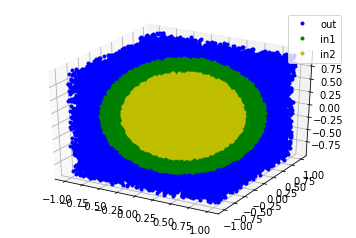

real volume difference=2.42164433714
volume difference est=2.43034482759
sample size=58000
absolute error=0.00870049044407
percentage error=0.359280275416


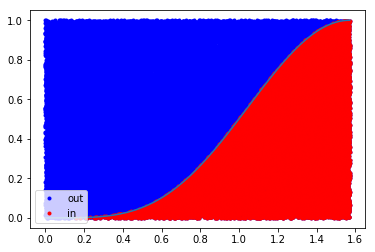

real area=0.589048622548
area=0.583334173842
sample size=58000
Absolute error=0.0057144487061
percentage error=0.970114942529


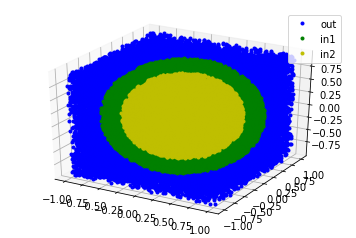

real volume difference=2.42164433714
volume difference est=2.4246779661
sample size=59000
absolute error=0.00303362895956
percentage error=0.125271449363


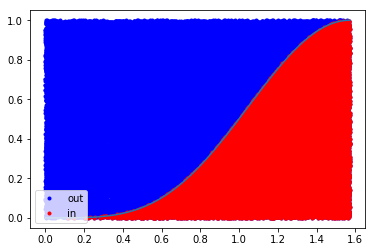

real area=0.589048622548
area=0.590486300542
sample size=59000
Absolute error=0.00143767799402
percentage error=0.24406779661


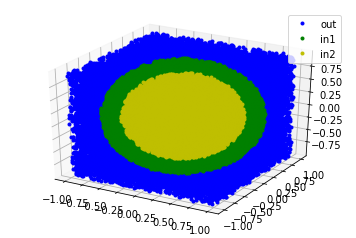

real volume difference=2.42164433714
volume difference est=2.416
sample size=60000
absolute error=0.00564433714213
percentage error=0.233078700103


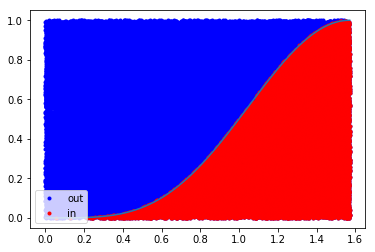

real area=0.589048622548
area=0.591483356855
sample size=60000
Absolute error=0.00243473430653
percentage error=0.413333333333


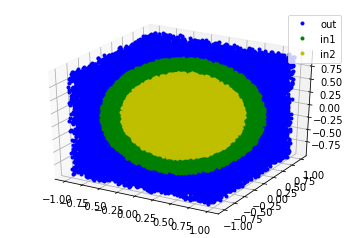

real volume difference=2.42164433714
volume difference est=2.42137704918
sample size=61000
absolute error=0.000267287961805
percentage error=0.0110374573882


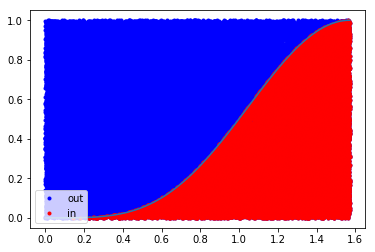

real area=0.589048622548
area=0.584001473695
sample size=61000
Absolute error=0.00504714885331
percentage error=0.856830601093


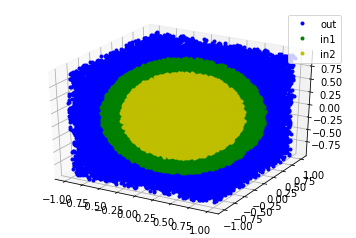

real volume difference=2.42164433714
volume difference est=2.39909677419
sample size=62000
absolute error=0.0225475629486
percentage error=0.931084825412


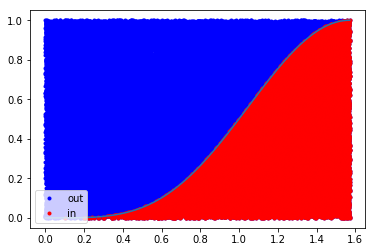

real area=0.589048622548
area=0.588845939151
sample size=62000
Absolute error=0.000202683397006
percentage error=0.0344086021505


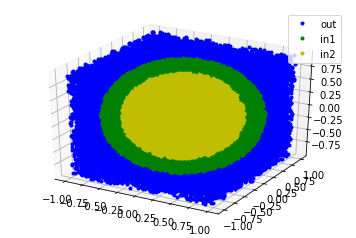

real volume difference=2.42164433714
volume difference est=2.41422222222
sample size=63000
absolute error=0.00742211491991
percentage error=0.30649070989


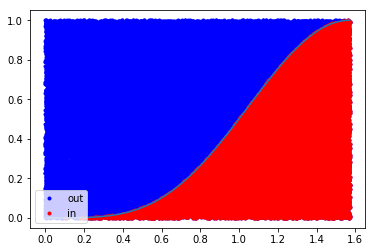

real area=0.589048622548
area=0.589497421499
sample size=63000
Absolute error=0.000448798950513
percentage error=0.0761904761905


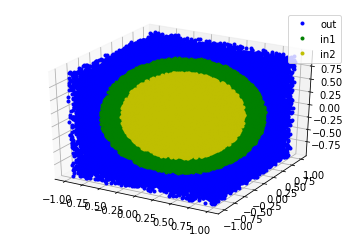

real volume difference=2.42164433714
volume difference est=2.410125
sample size=64000
absolute error=0.0115193371421
percentage error=0.475682451195


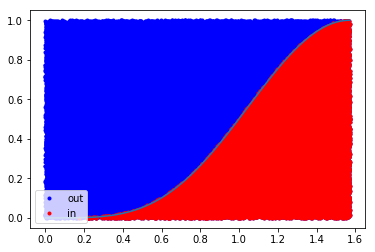

real area=0.589048622548
area=0.591576622887
sample size=64000
Absolute error=0.00252800033844
percentage error=0.429166666667


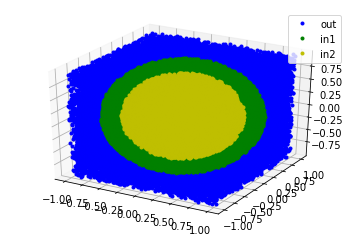

real volume difference=2.42164433714
volume difference est=2.42055384615
sample size=65000
absolute error=0.00109049098829
percentage error=0.0450310134961


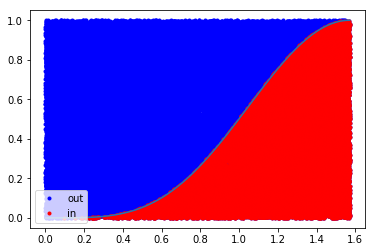

real area=0.589048622548
area=0.588420304017
sample size=65000
Absolute error=0.000628318530718
percentage error=0.106666666667


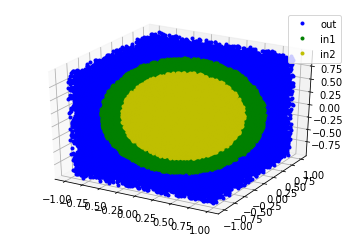

real volume difference=2.42164433714
volume difference est=2.40787878788
sample size=66000
absolute error=0.0137655492633
percentage error=0.568438108446


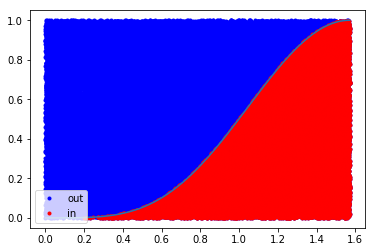

real area=0.589048622548
area=0.594189410527
sample size=66000
Absolute error=0.0051407879786
percentage error=0.872727272727


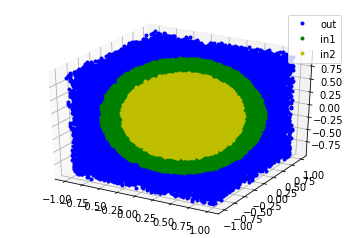

real volume difference=2.42164433714
volume difference est=2.39832835821
sample size=67000
absolute error=0.0233159789332
percentage error=0.962815991414


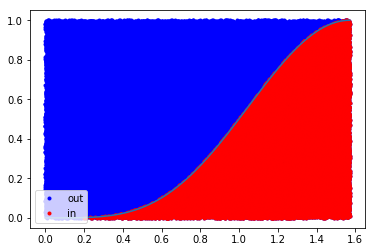

real area=0.589048622548
area=0.593667232643
sample size=67000
Absolute error=0.0046186100952
percentage error=0.78407960199


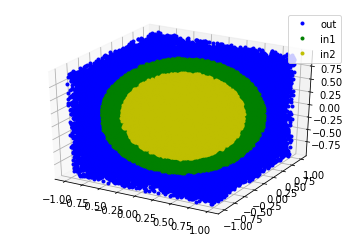

real volume difference=2.42164433714
volume difference est=2.41447058824
sample size=68000
absolute error=0.00717374890684
percentage error=0.296234620287


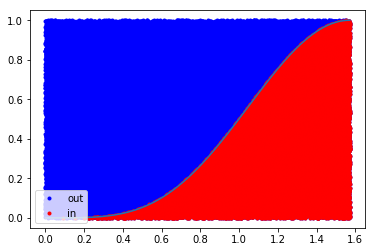

real area=0.589048622548
area=0.588355624169
sample size=68000
Absolute error=0.000692998379468
percentage error=0.117647058824


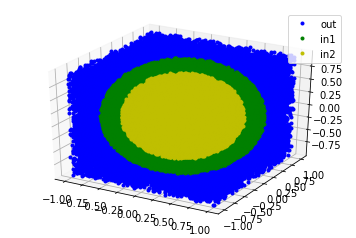

real volume difference=2.42164433714
volume difference est=2.41147826087
sample size=69000
absolute error=0.0101660762726
percentage error=0.419800551082


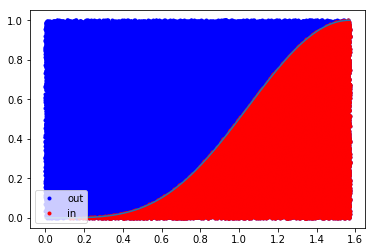

real area=0.589048622548
area=0.585292370462
sample size=69000
Absolute error=0.00375625208581
percentage error=0.63768115942


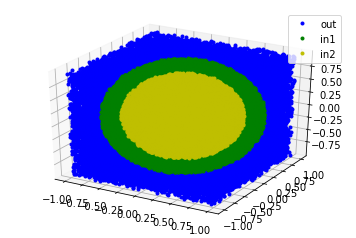

real volume difference=2.42164433714
volume difference est=2.44057142857
sample size=70000
absolute error=0.0189270914293
percentage error=0.781580149446


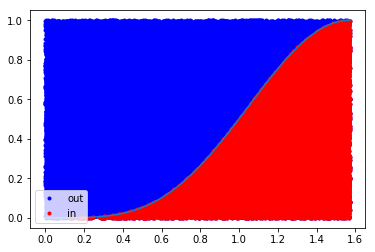

real area=0.589048622548
area=0.589273022023
sample size=70000
Absolute error=0.000224399475256
percentage error=0.0380952380952


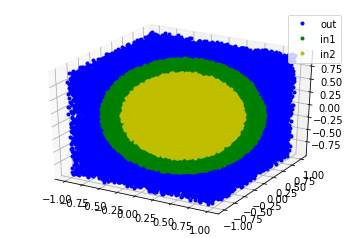

real volume difference=2.42164433714
volume difference est=2.43121126761
sample size=71000
absolute error=0.0095669304635
percentage error=0.395059270958


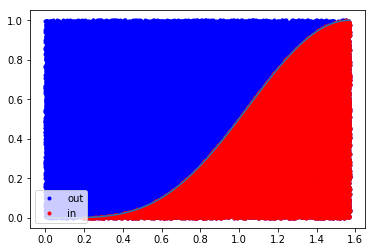

real area=0.589048622548
area=0.590951277254
sample size=71000
Absolute error=0.0019026547057
percentage error=0.323004694836


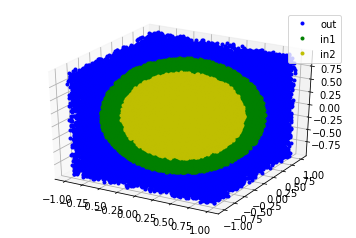

real volume difference=2.42164433714
volume difference est=2.41477777778
sample size=72000
absolute error=0.00686655936435
percentage error=0.283549456831


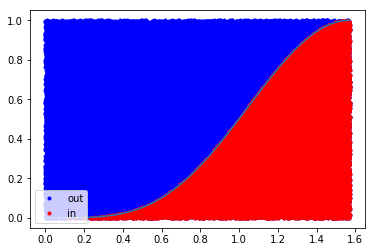

real area=0.589048622548
area=0.591906599198
sample size=72000
Absolute error=0.00285797665014
percentage error=0.485185185185


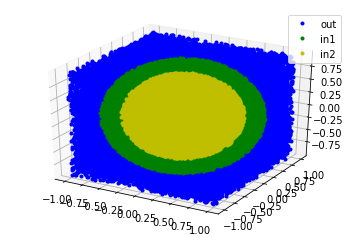

real volume difference=2.42164433714
volume difference est=2.42345205479
sample size=73000
absolute error=0.00180771765239
percentage error=0.0746483546185


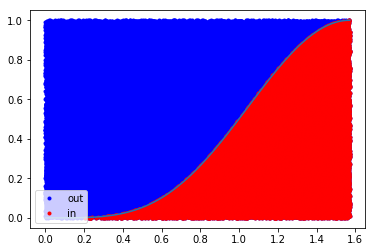

real area=0.589048622548
area=0.590382723538
sample size=73000
Absolute error=0.00133410098988
percentage error=0.226484018265


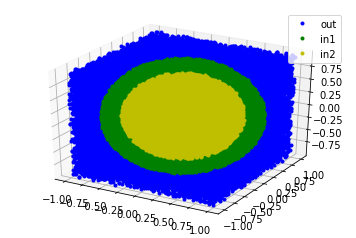

real volume difference=2.42164433714
volume difference est=2.42627027027
sample size=74000
absolute error=0.00462593312814
percentage error=0.191024464542


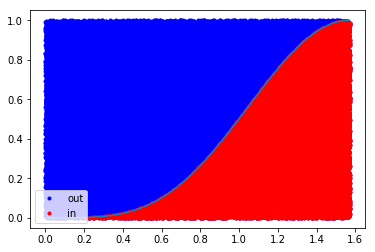

real area=0.589048622548
area=0.585822121985
sample size=74000
Absolute error=0.00322650056315
percentage error=0.547747747748


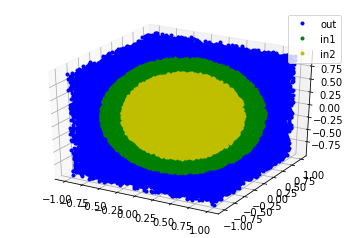

real volume difference=2.42164433714
volume difference est=2.42229333333
sample size=75000
absolute error=0.000648996191201
percentage error=0.0267998145412


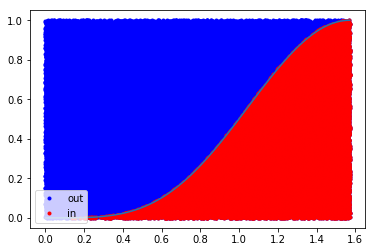

/home/dario/.local/lib/python2.7/site-packages/ipykernel_launcher.py:37: RuntimeWarning: divide by zero encountered in log10


real area=0.589048622548
area=0.589048622548
sample size=75000
Absolute error=0.0
percentage error=0.0


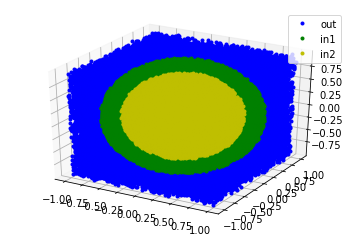

real volume difference=2.42164433714
volume difference est=2.44031578947
sample size=76000
absolute error=0.0186714523316
percentage error=0.771023723227


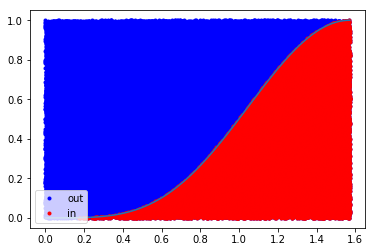

real area=0.589048622548
area=0.582930784223
sample size=76000
Absolute error=0.00611783832541
percentage error=1.03859649123


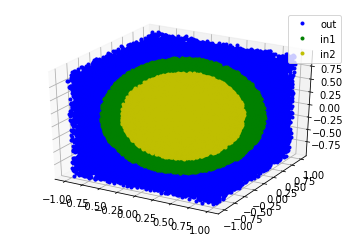

real volume difference=2.42164433714
volume difference est=2.43761038961
sample size=77000
absolute error=0.0159660524683
percentage error=0.659306250029


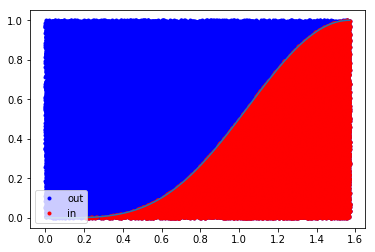

real area=0.589048622548
area=0.586763827891
sample size=77000
Absolute error=0.00228479465716
percentage error=0.387878787879


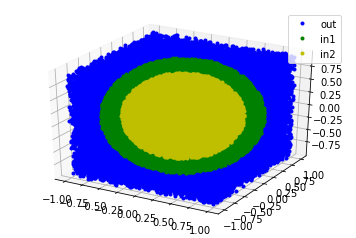

real volume difference=2.42164433714
volume difference est=2.40851282051
sample size=78000
absolute error=0.0131315166293
percentage error=0.542256202858


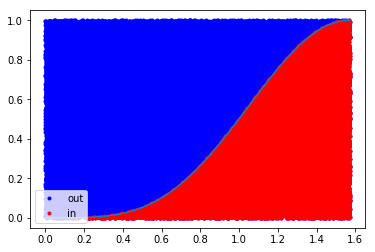

real area=0.589048622548
area=0.58715561159
sample size=78000
Absolute error=0.00189301095793
percentage error=0.321367521368


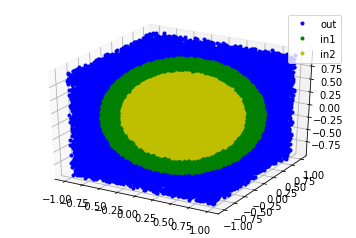

real volume difference=2.42164433714
volume difference est=2.42875949367
sample size=79000
absolute error=0.00711515652875
percentage error=0.293815091656


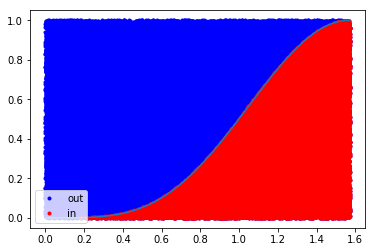

real area=0.589048622548
area=0.589545709993
sample size=79000
Absolute error=0.000497087445188
percentage error=0.084388185654


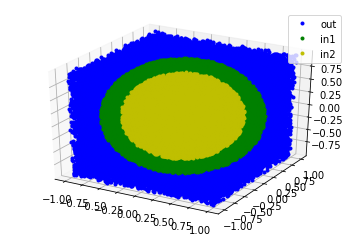

real volume difference=2.42164433714
volume difference est=2.4012
sample size=80000
absolute error=0.0204443371421
percentage error=0.844233681576


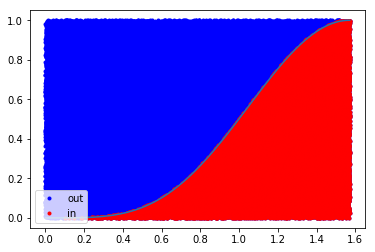

real area=0.589048622548
area=0.587890160257
sample size=80000
Absolute error=0.00115846229101
percentage error=0.196666666667


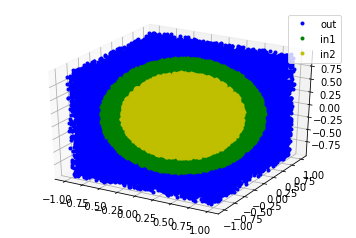

real volume difference=2.42164433714
volume difference est=2.43348148148
sample size=81000
absolute error=0.0118371443393
percentage error=0.488806062798


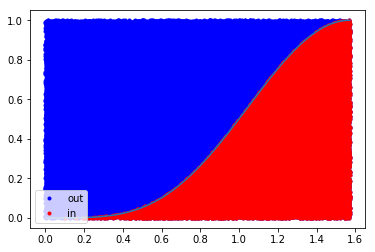

real area=0.589048622548
area=0.587089975276
sample size=81000
Absolute error=0.00195864727168
percentage error=0.332510288066


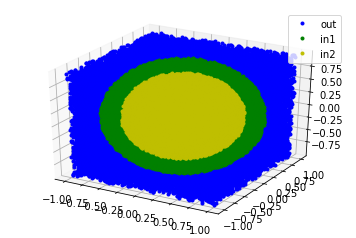

real volume difference=2.42164433714
volume difference est=2.4036097561
sample size=82000
absolute error=0.0180345810446
percentage error=0.744724597579


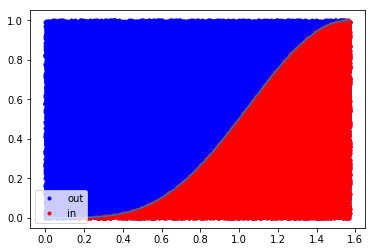

real area=0.589048622548
area=0.588722969651
sample size=82000
Absolute error=0.000325652897018
percentage error=0.0552845528455


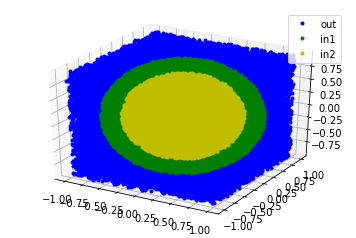

real volume difference=2.42164433714
volume difference est=2.4141686747
sample size=83000
absolute error=0.00747566244334
percentage error=0.308701915004


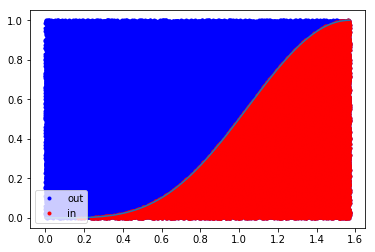

real area=0.589048622548
area=0.591471055438
sample size=83000
Absolute error=0.00242243288952
percentage error=0.41124497992


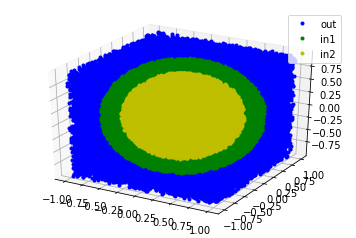

real volume difference=2.42164433714
volume difference est=2.41019047619
sample size=84000
absolute error=0.0114538609517
percentage error=0.472978660656


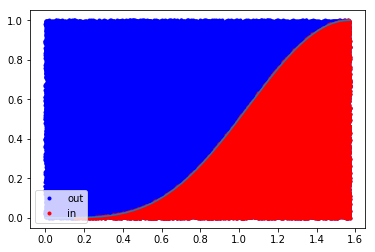

real area=0.589048622548
area=0.589908820537
sample size=84000
Absolute error=0.000860197988483
percentage error=0.146031746032


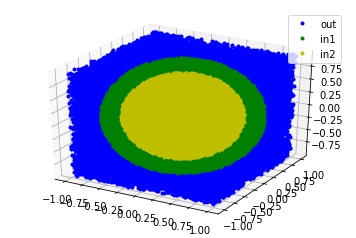

real volume difference=2.42164433714
volume difference est=2.43849411765
sample size=85000
absolute error=0.0168497805049
percentage error=0.695799141372


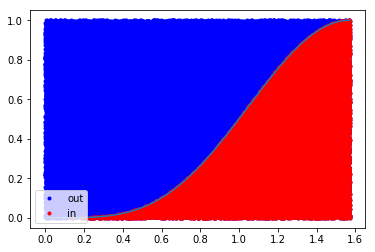

real area=0.589048622548
area=0.586424468684
sample size=85000
Absolute error=0.00262415386359
percentage error=0.445490196078


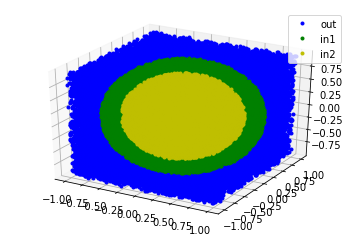

real volume difference=2.42164433714
volume difference est=2.42976744186
sample size=86000
absolute error=0.00812310471833
percentage error=0.335437561732


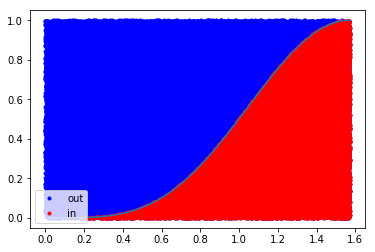

real area=0.589048622548
area=0.587660476957
sample size=86000
Absolute error=0.00138814559112
percentage error=0.235658914729


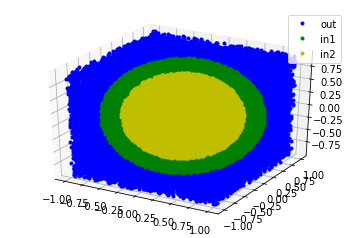

real volume difference=2.42164433714
volume difference est=2.4115862069
sample size=87000
absolute error=0.0100581302456
percentage error=0.415343000263


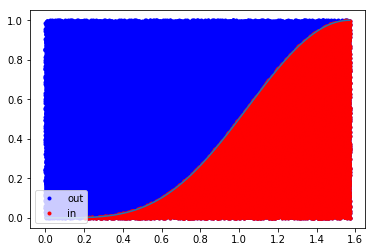

real area=0.589048622548
area=0.589048622548
sample size=87000
Absolute error=0.0
percentage error=0.0


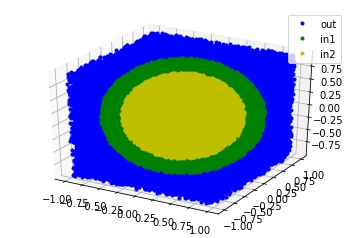

real volume difference=2.42164433714
volume difference est=2.42481818182
sample size=88000
absolute error=0.00317384467605
percentage error=0.131061552986


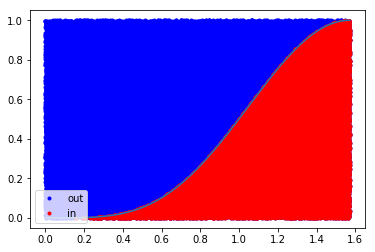

real area=0.589048622548
area=0.582943936823
sample size=88000
Absolute error=0.00610468572459
percentage error=1.03636363636


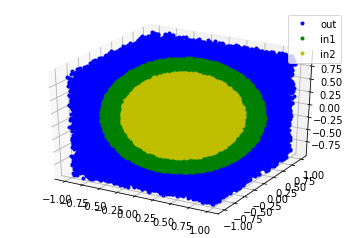

real volume difference=2.42164433714
volume difference est=2.42786516854
sample size=89000
absolute error=0.00622083139719
percentage error=0.256884601169


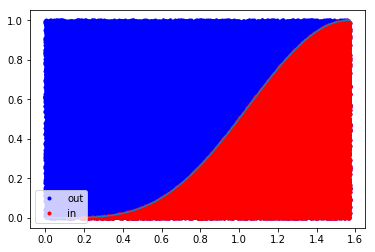

real area=0.589048622548
area=0.590584120081
sample size=89000
Absolute error=0.00153549753293
percentage error=0.260674157303


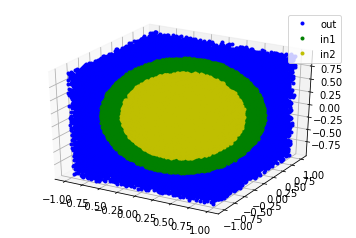

real volume difference=2.42164433714
volume difference est=2.43697777778
sample size=90000
absolute error=0.0153334406356
percentage error=0.633183015378


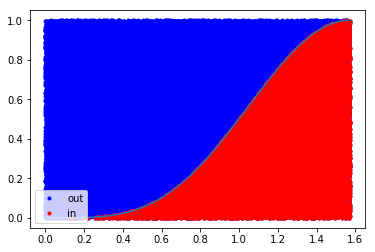

real area=0.589048622548
area=0.591701523011
sample size=90000
Absolute error=0.00265290046303
percentage error=0.45037037037


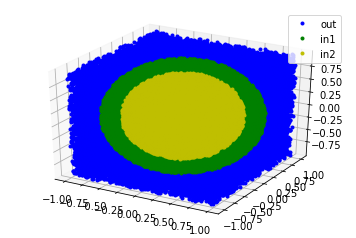

real volume difference=2.42164433714
volume difference est=2.41828571429
sample size=91000
absolute error=0.00335862285642
percentage error=0.138691830378


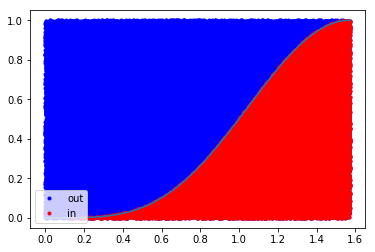

real area=0.589048622548
area=0.58613142937
sample size=91000
Absolute error=0.00291719317833
percentage error=0.495238095238


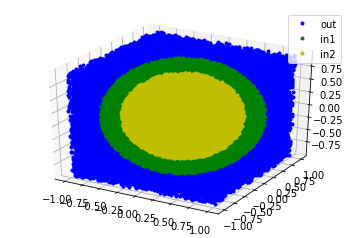

real volume difference=2.42164433714
volume difference est=2.43226086957
sample size=92000
absolute error=0.0106165324231
percentage error=0.438401802455


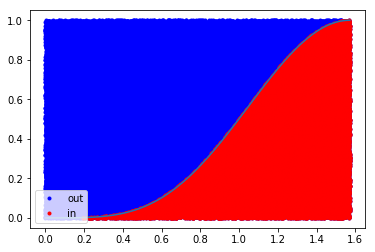

real area=0.589048622548
area=0.589116918041
sample size=92000
Absolute error=6.82954924693e-05
percentage error=0.0115942028986


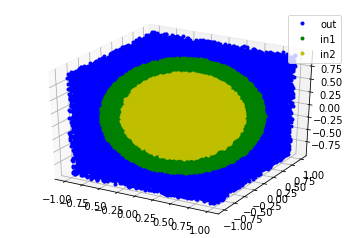

real volume difference=2.42164433714
volume difference est=2.42933333333
sample size=93000
absolute error=0.0076889961912
percentage error=0.317511373296


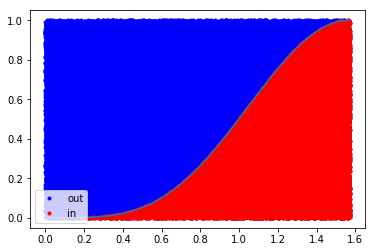

real area=0.589048622548
area=0.588845939151
sample size=93000
Absolute error=0.000202683397006
percentage error=0.0344086021505


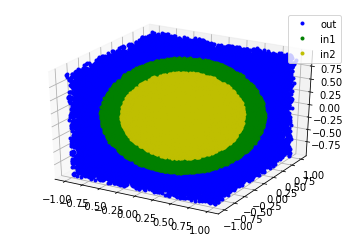

real volume difference=2.42164433714
volume difference est=2.41455319149
sample size=94000
absolute error=0.00709114565277
percentage error=0.292823580408


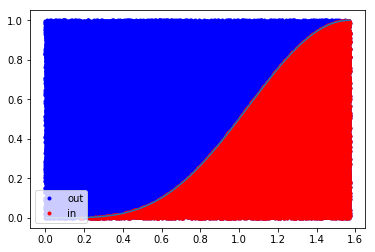

real area=0.589048622548
area=0.588330066782
sample size=94000
Absolute error=0.000718555766513
percentage error=0.121985815603


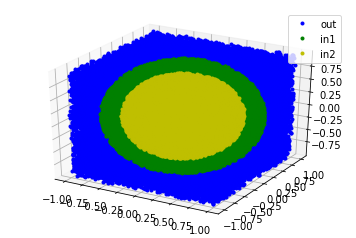

real volume difference=2.42164433714
volume difference est=2.42037894737
sample size=95000
absolute error=0.00126538977371
percentage error=0.0522533286289


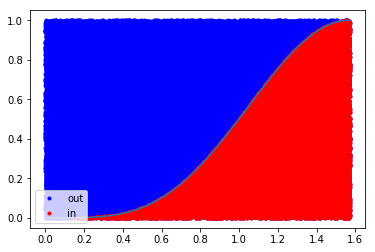

real area=0.589048622548
area=0.586832972992
sample size=95000
Absolute error=0.00221564955569
percentage error=0.376140350877


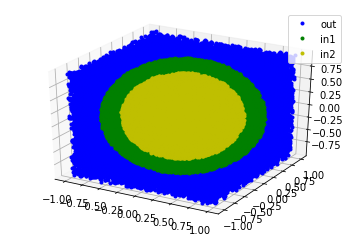

real volume difference=2.42164433714
volume difference est=2.43533333333
sample size=96000
absolute error=0.0136889961912
percentage error=0.565276906325


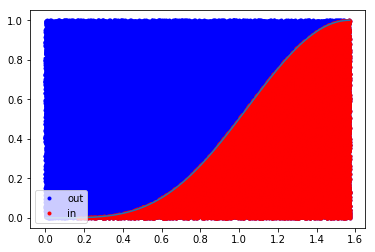

real area=0.589048622548
area=0.591355729653
sample size=96000
Absolute error=0.00230710710498
percentage error=0.391666666667


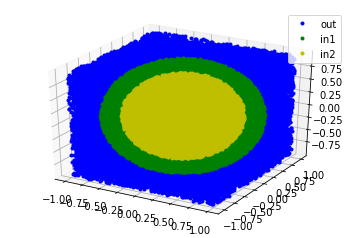

real volume difference=2.42164433714
volume difference est=2.41022680412
sample size=97000
absolute error=0.0114175330184
percentage error=0.471478525699


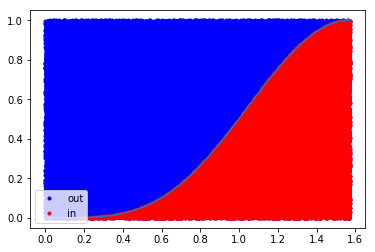

real area=0.589048622548
area=0.590068830472
sample size=97000
Absolute error=0.00102020792359
percentage error=0.173195876289


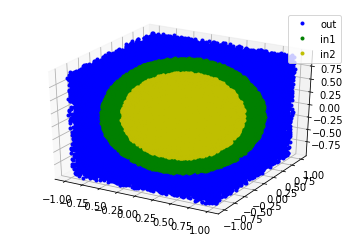

real volume difference=2.42164433714
volume difference est=2.44783673469
sample size=98000
absolute error=0.0261923975517
percentage error=1.08159555679


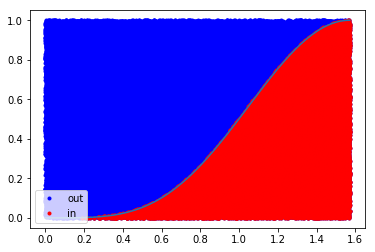

real area=0.589048622548
area=0.588423509724
sample size=98000
Absolute error=0.000625112823929
percentage error=0.10612244898


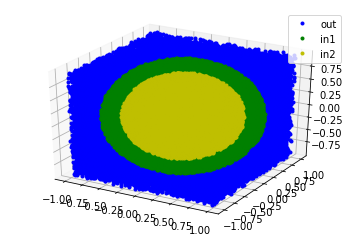

real volume difference=2.42164433714
volume difference est=2.42044444444
sample size=99000
absolute error=0.00119989269769
percentage error=0.0495486756368


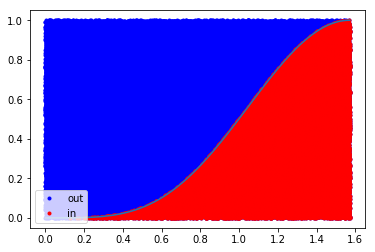

real area=0.589048622548
area=0.589667421101
sample size=99000
Absolute error=0.00061879855298
percentage error=0.10505050505


In [177]:
LogSample=[]    
sample=[]

errorList1=[]  
errorList2=[]  
RelErrList2=[] 
RelErrList1=[] 

for n in range(1000,100000,1000):
    VolDiff(1,0.75,n)
    area(np.pi/2,n)
    LogSample.append(np.log10(float(n)))
    sample.append(float(n))


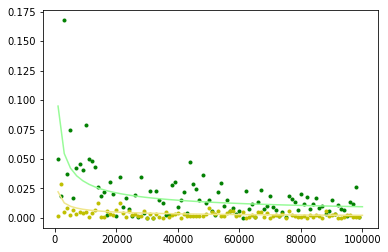

In [178]:

plt.plot(sample, (errorList1),'g.', ) #sphere
plt.plot(sample, (errorList2),'y.')
a=np.linspace(1000,100000)
plt.plot(a, 3/np.sqrt(a),color='#98FB98')
plt.plot(a, 0.7/np.sqrt(a),color='#F0E68C')

plt.show()

Monte Carlo algorithm is not (in general) the best for efficiency, but it's extremely easy to implement and it can be powerful as well as efficient for computations when more dimensions are involved (as mentioned earlier).
It has also many other circumstances where it can be used, for example when studying climate change.


## Conclusion

This course was structured in a wonderful hands-on way with lots of practical guided exercises and examples. It allowed me to learn and be ready to use python as a powerful computational tool with only (relatively) few hours of lectures/practice. It has been very exciting and stimulating. 
I also had to learn how to get  information I needed (for example on 3D plotting) from the internet. This is a  useful "skill" because I feel like I could handle new problems with even less help from a teacher. I  want to learn more about python and its range of applications. 
It is certainly worthwhile practicing with python to be able to handle/generate huge volumes of data. It is common in astronomy and particle physics to deal with large arrays of data and it's also a valuable skill in other sectors such as data science.

